# Imports

In [1]:
%load_ext autoreload
%autoreload 2
import sys

sys.path.append('../../')

In [2]:
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt

import pyaldata as pyal
import tools.dsp as dsp
from tools.params import Params
import tools.dimensionality as dim
import tools.dataTools as dt
from tools.params import colors
import tools.kinematics as kin

from tqdm import tqdm
import tools.viz.utilityTools as vizutils



In [3]:
SESSIONS = [
    # "M103_2026_02_18_15_30",
    # "M103_2026_02_20_16_00",
    "M106_2026_02_25_15_00",
    # "M106_2026_02_27_16_00",
    # 'M086_2025_12_11_15_00',
    # 'M086_2025_12_10_15_00'
]

# all_sess_proc = {}
# for sess in SESSIONS:
    # td, _ = dsp.load_and_process_session(sess, std=0.03)
    # perturb_td = pyal.restrict_to_interval(
    #     td, start_point_name='idx_sol_on', rel_start=-200, rel_end=300
    # )
    # perturb_td = perturb_td.sample(frac=1, random_state=42).reset_index(drop=False)
    # perturb_td    = dsp.drop_trials_sem_crosses_zero(perturb_td, std=True)
    # all_sess_proc[sess] = perturb_td


In [4]:
data_dir="C:/data/raw/"
session = SESSIONS[0]
df = pyal.load_pyaldata(data_dir + session[:4] + "/" + session)
df__ = dsp.preprocess(df, only_trials=False, combine_time_bins=False, std=0.03)


C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\data_cleaning.py:120: UserWarning: fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
  utils.warnings.warn(f"fields: {bad_fields} could not be converted to int.")
C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\data_cleaning.py:120: UserWarning: fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
  utils.warnings.warn(f"fields: {bad_fields} could not be converted to int.")
C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\data_cleaning.py:120: UserWarning: fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
  utils.warnings.warn(f"fields: {bad_fields} could not be converted to int.")
C:\

['CP_spikes', 'MOp_spikes', 'all_spikes', 'VAL_spikes', 'SSp_spikes']
Resulting CP_spikes ephys data shape is (NxT): (206, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (156, 48000)
Resulting all_spikes ephys data shape is (NxT): (11, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (132, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (142, 48000)


In [ ]:
df = dt.add_bhv(df__, bhv_fields=Params.oscillating_key_points)
feature_dims = np.arange(start=2, stop=len(Params.oscillating_key_points) * 3, step=3)
df = dt.concat_previous_intertrial_signal(df, "bhv", features=feature_dims)


In [ ]:
df = dt.add_concat_perturb_time(df)
df = dt.add_concat_trial_start(df)

add_concat_perturb_time: dropping 1 trial(s) with missing idx_sol_on


In [26]:
trials = []
for idx, row in df.iterrows():
        if row.trial_name != "trial":
            continue
        perturb_idx = row.concat_perturb_time
        arr = row.bhv_concat[perturb_idx - 300 : perturb_idx + 399]
        # print(arr.shape)
        trials.append(arr)
        # print()
trials = np.stack(trials)

In [27]:
peak_freqs_list = []
for idx, row in df.iterrows():
    if row.trial_name != "trial":
        continue
    perturb_idx = row.concat_perturb_time
    if perturb_idx is None:
        continue
    peak_freqs, freqs, psd = kin.compute_peak_freq_pre_perturb(
        row.bhv_concat, perturb_idx=perturb_idx
    )
    peak_freqs_list.append(peak_freqs)

peak_freqs_arr = np.stack(peak_freqs_list)  # (n_trials, n_keypoints)

print(f"Peak frequencies computed for {peak_freqs_arr.shape[0]} trials x {peak_freqs_arr.shape[1]} keypoints")
for kp, mean_f, median_f, std_f in zip(
    Params.oscillating_key_points,
    peak_freqs_arr.mean(axis=0),
    np.median(peak_freqs_arr, axis=0),
    peak_freqs_arr.std(axis=0),
):
    print(f"  {kp:>16s}: mean={mean_f:5.2f} Hz  median={median_f:5.2f} Hz  std={std_f:5.2f} Hz")

Peak frequencies computed for 499 trials x 12 keypoints
        left_ankle: mean= 5.00 Hz  median= 6.64 Hz  std= 2.83 Hz
        left_elbow: mean= 5.23 Hz  median= 6.64 Hz  std= 2.65 Hz
         left_foot: mean= 5.50 Hz  median= 6.64 Hz  std= 2.46 Hz
         left_knee: mean= 4.96 Hz  median= 6.64 Hz  std= 2.85 Hz
          left_paw: mean= 5.71 Hz  median= 6.64 Hz  std= 2.21 Hz
        left_wrist: mean= 5.70 Hz  median= 6.64 Hz  std= 2.20 Hz
       right_ankle: mean= 5.52 Hz  median= 6.64 Hz  std= 2.39 Hz
       right_elbow: mean= 5.79 Hz  median= 6.64 Hz  std= 2.11 Hz
        right_foot: mean= 5.61 Hz  median= 6.64 Hz  std= 2.32 Hz
        right_knee: mean= 5.48 Hz  median= 6.64 Hz  std= 2.41 Hz
         right_paw: mean= 5.93 Hz  median= 6.64 Hz  std= 1.89 Hz
       right_wrist: mean= 5.92 Hz  median= 6.64 Hz  std= 1.89 Hz


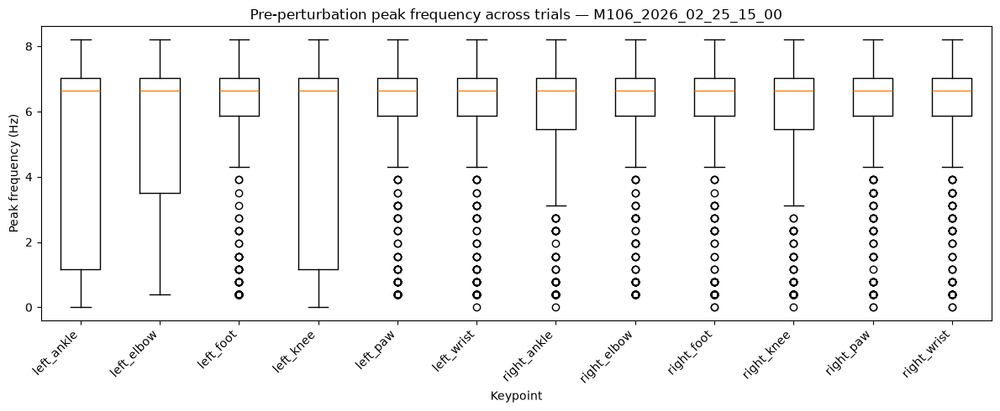

In [29]:
fig, ax = plt.subplots(figsize=(12, 5))
ax.boxplot(peak_freqs_arr, tick_labels=Params.oscillating_key_points)
ax.set_ylabel("Peak frequency (Hz)")
ax.set_xlabel("Keypoint")
ax.set_title(f"Pre-perturbation peak frequency across trials — {session}")
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [5]:
df_perturb_score = kin.compute_power_in_bhv_concat_td(df)


KeyError: "None of [Index(['bhv_concat', 'concat_perturb_time'], dtype='str')] are in the [columns]"

In [10]:
df_perturb_score = kin.compute_perturb_score(
    df__, bhv_fields=Params.oscillating_key_points
)

add_concat_perturb_time: dropping 1 trial(s) with missing idx_sol_on
411 / 499 trials pass the peak_mean_freq >= 2 Hz gate (82.4%)


In [11]:
df_perturb_score

,animal,session,trial_id,trial_name,trial_length,bin_size,idx_trial_start,idx_trial_end,idx_CPI,values_before_camera_trigger,...,SSp_rates,sol_level_id,sol_contra_ipsi,bhv,bhv_concat,concat_perturb_time,concat_trial_start,power,phases,disturb_score
0,M106,M106_2026_02_25_15_00,0,free,48000,0.01,0,47999,[],1,...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",NaN,NaN,"[[-2.0598765903820424, 13.408386726679147, 194...",None,None,None,None,None,None
1,M106,M106_2026_02_25_15_00,1,intertrial,300,0.01,48000,48299,[],[],...,"[[0.6726428866386414, 0.0, 0.0, 0.0, 0.6726428...",NaN,NaN,"[[0.6319353284468224, 14.402034637143096, 192....",None,None,None,None,None,None
2,M106,M106_2026_02_25_15_00,2,trial,600,0.01,48300,48899,[],[],...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 14.38696533441...",0.0,1.0,"[[4.7113735826335, 13.690610198263672, 194.104...","[[192.25682595866687, 175.95349464921964, 186....",500,300,"[[1.2456079450001143, 1.1763614363587633, 1.64...","[[-0.03103617700968566, -1.9180891007058731, -...","[0.025787896600722976, 0.18744391855646128, -0..."
3,M106,M106_2026_02_25_15_00,3,intertrial,100,0.01,48900,48999,[],[],...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.81922650337...",NaN,NaN,"[[4.719819369216153, 13.883739337726473, 190.5...",None,None,None,None,None,None
4,M106,M106_2026_02_25_15_00,4,trial,600,0.01,49000,49599,[],[],...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 18.468809127807617,...",0.0,1.0,"[[4.293750991903091, 13.685706393891431, 194.8...","[[190.55076207954733, 176.0942658871152, 185.3...",300,100,"[[1.7733458841055916, 0.6911483343834861, 2.22...","[[2.123601015452111, 1.6522795470493394, 2.001...","[-0.8652581191544616, 0.04188148499683571, -0...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
996,M106,M106_2026_02_25_15_00,996,trial,600,0.01,496000,496599,[],[],...,"[[27.942845225334167, 0.0, 19.14145201444626, ...",0.0,0.0,"[[3.725165190426778, 14.257670140115824, 198.3...","[[202.9451057133885, 174.24232791539308, 201.9...",500,300,"[[1.7811410429160224, 0.554667607558075, 2.256...","[[-1.3204448472732013, -2.323731616749406, -1....","[-0.2448781945734474, -0.22151950739668205, -0..."
997,M106,M106_2026_02_25_15_00,997,intertrial,500,0.01,496600,497099,[],[],...,"[[0.002371225673414301, 1.5119582414627075, 0....",NaN,NaN,"[[3.215530813433844, 13.575365272984026, 194.7...",None,None,None,None,None,None
998,M106,M106_2026_02_25_15_00,998,trial,600,0.01,497100,497699,[],[],...,"[[2.185133844614029, 0.0, 13.992717862129211, ...",1.0,1.0,"[[1.2827552613207662, 13.901322697675694, 195....","[[194.70945733834083, 176.66048517103852, 189....",700,500,"[[1.3196770554724722, 0.35126471357078576, 1.9...","[[-1.6301222834764335, 1.6526444138932077, -1....","[0.22243034587665364, 0.038369293401571546, 0...."
999,M106,M106_2026_02_25_15_00,999,intertrial,100,0.01,497700,497799,[],[],...,"[[42.19643473625183, 0.0, 0.2694053342565894, ...",NaN,NaN,"[[0.1561075570568887, 13.853839884743657, 193....",None,None,None,None,None,None


# Effect of the freq_tresh=2 Hz gate (peak_mean_freq) on per-keypoint peak frequency

In [30]:
peak_mean_freqs = []
for idx, row in df.iterrows():
    if row.trial_name != "trial":
        continue
    perturb_idx = row.concat_perturb_time
    if perturb_idx is None:
        continue
    _, freqs, psd = kin.compute_peak_freq_pre_perturb(
        row.bhv_concat, perturb_idx=perturb_idx
    )
    peak_mean_freqs.append(freqs[np.argmax(psd.mean(-1), axis=0)])

peak_mean_freqs = np.array(peak_mean_freqs)
gate_mask = peak_mean_freqs >= 2  # mirrors freq_tresh in compute_power_in_bhv_concat_td

print(f"{gate_mask.sum()} / {len(gate_mask)} trials pass the peak_mean_freq >= 2 Hz gate ({gate_mask.mean():.1%})")
print(f"peak_mean_freq, all trials:     mean={peak_mean_freqs.mean():.2f} Hz  median={np.median(peak_mean_freqs):.2f} Hz")
print(f"peak_mean_freq, passing trials: mean={peak_mean_freqs[gate_mask].mean():.2f} Hz  median={np.median(peak_mean_freqs[gate_mask]):.2f} Hz")

412 / 499 trials pass the peak_mean_freq >= 2 Hz gate (82.6%)
peak_mean_freq, all trials:     mean=5.51 Hz  median=6.64 Hz
peak_mean_freq, passing trials: mean=6.56 Hz  median=6.64 Hz


Peak frequencies for 412 trials passing the 2 Hz gate
        left_ankle: mean= 5.93 Hz  median= 6.64 Hz  std= 2.15 Hz
        left_elbow: mean= 6.09 Hz  median= 6.64 Hz  std= 1.94 Hz
         left_foot: mean= 6.48 Hz  median= 6.64 Hz  std= 1.24 Hz
         left_knee: mean= 5.87 Hz  median= 6.64 Hz  std= 2.22 Hz
          left_paw: mean= 6.47 Hz  median= 6.64 Hz  std= 1.23 Hz
        left_wrist: mean= 6.46 Hz  median= 6.64 Hz  std= 1.23 Hz
       right_ankle: mean= 6.41 Hz  median= 6.64 Hz  std= 1.36 Hz
       right_elbow: mean= 6.54 Hz  median= 6.64 Hz  std= 1.06 Hz
        right_foot: mean= 6.47 Hz  median= 6.64 Hz  std= 1.26 Hz
        right_knee: mean= 6.40 Hz  median= 6.64 Hz  std= 1.34 Hz
         right_paw: mean= 6.55 Hz  median= 6.64 Hz  std= 0.98 Hz
       right_wrist: mean= 6.55 Hz  median= 6.64 Hz  std= 0.98 Hz


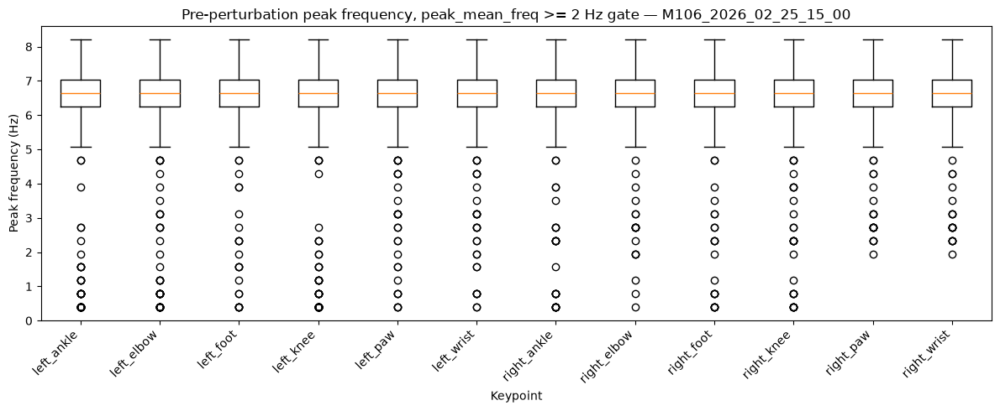

In [31]:
peak_freqs_gated = peak_freqs_arr[gate_mask]

print(f"Peak frequencies for {peak_freqs_gated.shape[0]} trials passing the 2 Hz gate")
for kp, mean_f, median_f, std_f in zip(
    Params.oscillating_key_points,
    peak_freqs_gated.mean(axis=0),
    np.median(peak_freqs_gated, axis=0),
    peak_freqs_gated.std(axis=0),
):
    print(f"  {kp:>16s}: mean={mean_f:5.2f} Hz  median={median_f:5.2f} Hz  std={std_f:5.2f} Hz")

fig, ax = plt.subplots(figsize=(12, 5))
ax.boxplot(peak_freqs_gated, tick_labels=Params.oscillating_key_points)
ax.set_ylabel("Peak frequency (Hz)")
ax.set_xlabel("Keypoint")
ax.set_title(f"Pre-perturbation peak frequency, peak_mean_freq >= 2 Hz gate — {session}")
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()

# Scroll through trials: raw traces, PSDs, power traces

No ipywidgets in this environment, so scrolling is manual: change `trial_idx` in the cell below and re-run it plus the three plotting cells that follow.

In [51]:
trial_rows = df_perturb_score[df_perturb_score.trial_name == "trial"].reset_index(drop=True)
print(f"{len(trial_rows)} perturbation trials available to scroll through (indices 0..{len(trial_rows) - 1})")

trial_idx = 1  # <-- change this and re-run this cell + the 3 plotting cells below

row = trial_rows.iloc[trial_idx]
perturb_idx = row.concat_perturb_time
has_power = isinstance(row.power, np.ndarray)
print(f"Trial {trial_idx}: concat_perturb_time={perturb_idx}, bhv_concat shape={row.bhv_concat.shape}, "
      f"power computed={has_power}")

499 perturbation trials available to scroll through (indices 0..498)
Trial 1: concat_perturb_time=300, bhv_concat shape=(700, 12), power computed=True


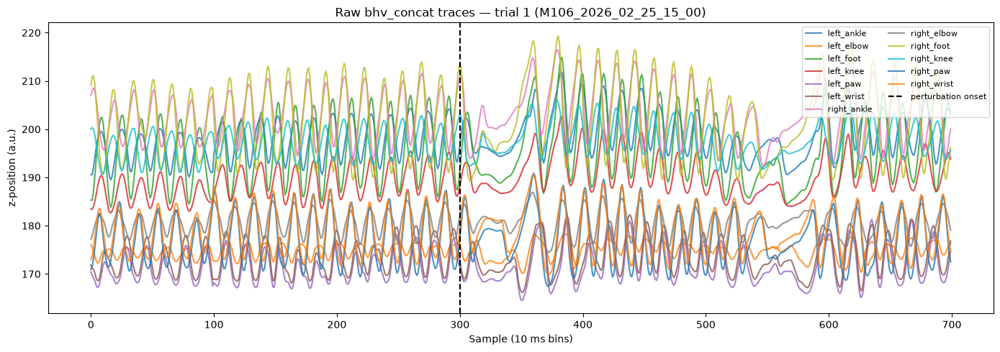

bhv_concat length: 700 samples, perturbation at sample 300


In [52]:
# 1) Raw traces (z-dimension of each keypoint, bhv_concat)
fig, ax = plt.subplots(figsize=(14, 5))
for i, kp in enumerate(Params.oscillating_key_points):
    ax.plot(row.bhv_concat[:, i], label=kp, alpha=0.8)
ax.axvline(perturb_idx, color="k", linestyle="--", label="perturbation onset")
ax.set_xlabel("Sample (10 ms bins)")
ax.set_ylabel("z-position (a.u.)")
ax.set_title(f"Raw bhv_concat traces — trial {trial_idx} ({session})")
ax.legend(loc="upper right", fontsize=8, ncol=2)
plt.tight_layout()
plt.show()

print(f"bhv_concat length: {row.bhv_concat.shape[0]} samples, perturbation at sample {perturb_idx}")

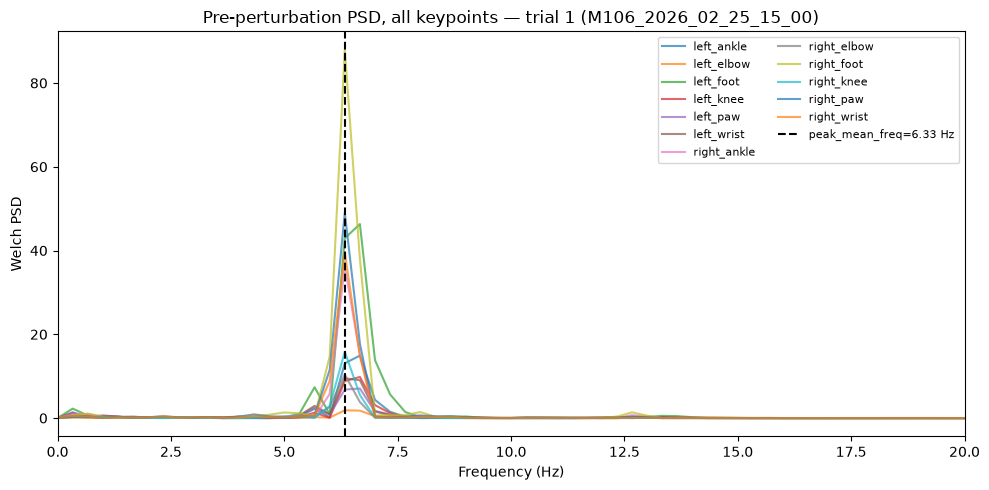

peak_mean_freq = 6.33 Hz
Per-keypoint peak freq (Hz): {'left_ankle': np.float64(6.67), 'left_elbow': np.float64(6.33), 'left_foot': np.float64(6.67), 'left_knee': np.float64(6.67), 'left_paw': np.float64(6.67), 'left_wrist': np.float64(6.33), 'right_ankle': np.float64(6.33), 'right_elbow': np.float64(6.33), 'right_foot': np.float64(6.33), 'right_knee': np.float64(6.33), 'right_paw': np.float64(6.33), 'right_wrist': np.float64(6.33)}


In [53]:
# 2) Overlapping pre-perturbation PSDs, all keypoints
peak_freqs, freqs, psd = kin.compute_peak_freq_pre_perturb(row.bhv_concat, perturb_idx=perturb_idx)
peak_mean_freq = freqs[np.argmax(psd.mean(-1), axis=0)]

fig, ax = plt.subplots(figsize=(10, 5))
for i, kp in enumerate(Params.oscillating_key_points):
    ax.plot(freqs, psd[:, i], label=kp, alpha=0.7)
ax.axvline(peak_mean_freq, color="k", linestyle="--", label=f"peak_mean_freq={peak_mean_freq:.2f} Hz")
ax.set_xlim(0, 20)
ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Welch PSD")
ax.set_title(f"Pre-perturbation PSD, all keypoints — trial {trial_idx} ({session})")
ax.legend(loc="upper right", fontsize=8, ncol=2)
plt.tight_layout()
plt.show()

print(f"peak_mean_freq = {peak_mean_freq:.2f} Hz")
print("Per-keypoint peak freq (Hz):", dict(zip(Params.oscillating_key_points, np.round(peak_freqs, 2))))

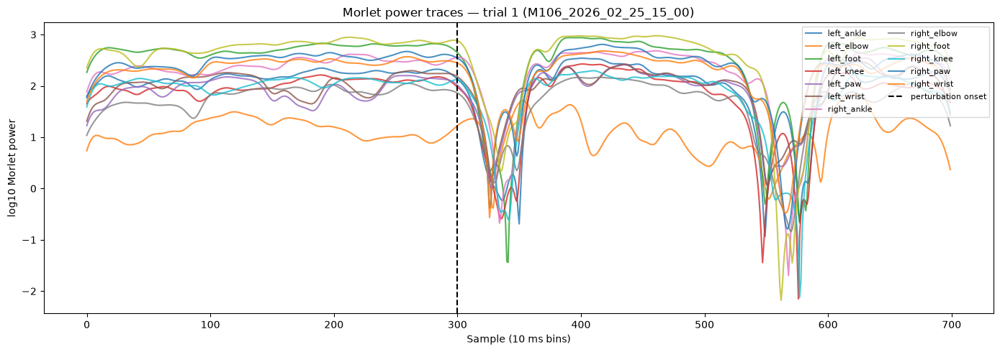

AttributeError: 'Series' object has no attribute 'disturb_score'

In [54]:
# 3) Morlet power traces (log10 power at peak_mean_freq), all keypoints
if not has_power:
    print(f"Trial {trial_idx} was skipped by the freq_tresh gate in compute_power_in_bhv_concat_td "
          f"(peak_mean_freq < 2 Hz) — no power/disturb_score available.")
else:
    fig, ax = plt.subplots(figsize=(14, 5))
    for i, kp in enumerate(Params.oscillating_key_points):
        ax.plot(row.power[:, i], label=kp, alpha=0.8)
    ax.axvline(perturb_idx, color="k", linestyle="--", label="perturbation onset")
    ax.set_xlabel("Sample (10 ms bins)")
    ax.set_ylabel("log10 Morlet power")
    ax.set_title(f"Morlet power traces — trial {trial_idx} ({session})")
    ax.legend(loc="upper right", fontsize=8, ncol=2)
    plt.tight_layout()
    plt.show()

    print("disturb_score per keypoint:", dict(zip(
        Params.oscillating_key_points, np.round(row.disturb_score, 2)
    )) if isinstance(row.disturb_score, np.ndarray) else "N/A")

# New loading implemented

In [4]:
SESSIONS = [
    # "M103_2026_02_18_15_30",
    # "M103_2026_02_20_16_00",
    "M106_2026_02_25_15_00",
    # "M106_2026_02_27_16_00",
    # 'M086_2025_12_11_15_00',
    # 'M086_2025_12_10_15_00'
]

# td, _ = dsp.load_and_process_session(SESSIONS[0], std=0.03)
    

In [5]:
df = pyal.load_pyaldata("C:/data/raw/" + SESSIONS[0][:4] + "/" + SESSIONS[0])

C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\data_cleaning.py:120: UserWarning: fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
  utils.warnings.warn(f"fields: {bad_fields} could not be converted to int.")
C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\data_cleaning.py:120: UserWarning: fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
  utils.warnings.warn(f"fields: {bad_fields} could not be converted to int.")
C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\data_cleaning.py:120: UserWarning: fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
  utils.warnings.warn(f"fields: {bad_fields} could not be converted to int.")


In [6]:
df_prepro = dsp.preprocess(df, only_trials=False, combine_time_bins=False, std=0.03)

C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\utils.py:164: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of CP_spikes on 99.9001996007984% of trials
  warnings.warn(
C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\utils.py:164: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of CP_spikes on 99.9001996007984% of trials
  warnings.warn(
C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\utils.py:164: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of CP_spikes on 99.9001996007984% of trials
  warnings.warn(
C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\utils.py:164: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of CP_spikes on 99.9001996007984% of trials
  warnings.warn(


['CP_spikes', 'MOp_spikes', 'all_spikes', 'VAL_spikes', 'SSp_spikes']


KeyboardInterrupt: 

In [ ]:
df_tr = kin.compute_perturb_score(
    df_prepro, 
    on_keypoints=Params.oscillating_keypoints
)
# df_tr = pyal.select_trials(df_tr, df_tr.trial_name == "trial")



bhv column not found adding it
add_concat_perturb_time: dropping 1 trial(s) with missing idx_sol_on
compute_power_in_bhv_concat_td: dropping 59 trial(s) with peak_mean_freq < 2 Hz


In [11]:
df_tr.columns

Index(['animal', 'session', 'trial_id', 'trial_name', 'trial_length',
       'bin_size', 'idx_trial_start', 'idx_trial_end', 'idx_CPI',
       'values_before_camera_trigger', 'idx_before_camera_trigger',
       'idx_motion', 'values_Sol_duration', 'idx_Sol_duration',
       'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on',
       'idx_earthquake_duration', 'idx_session_timer', 'values_MotSen1_X',
       'idx_MotSen1_X', 'values_MotSen1_Y', 'idx_MotSen1_Y', 'hip_center',
       'left_ankle', 'left_ankle_angle', 'left_elbow', 'left_elbow_angle',
       'left_foot', 'left_knee', 'left_knee_angle', 'left_paw',
       'left_shoulder', 'left_wrist', 'left_wrist_angle', 'right_ankle',
       'right_ankle_angle', 'right_elbow', 'right_elbow_angle', 'right_foot',
       'right_knee', 'right_knee_angle', 'right_paw', 'right_shoulder',
       'right_wrist', 'right_wrist_angle', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip', 'CP_chan_best', 'CP_unit_guide',
       'CP_k

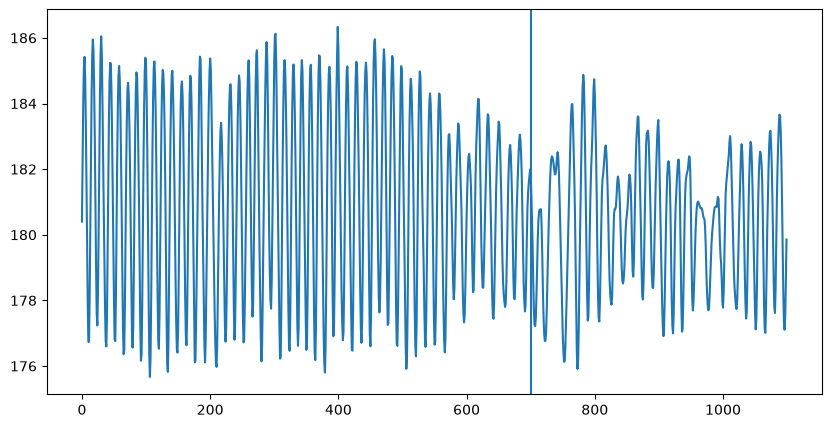

In [42]:
fig, ax = plt.subplots(figsize=(10, 5))
tr = 426
ax.plot(df_tr.bhv_concat.values[tr][:, 10])
ax.axvline(df_tr.concat_perturb_time.values[tr])

In [49]:
df_tr = dt.add_bhv(df_tr, bhv_fields=Params.oscillating_keypoints)
vel = np.gradient(np.concatenate(df_tr.bhv.values), axis=0)


In [51]:
speed = np.linalg.norm(vel, axis=1)

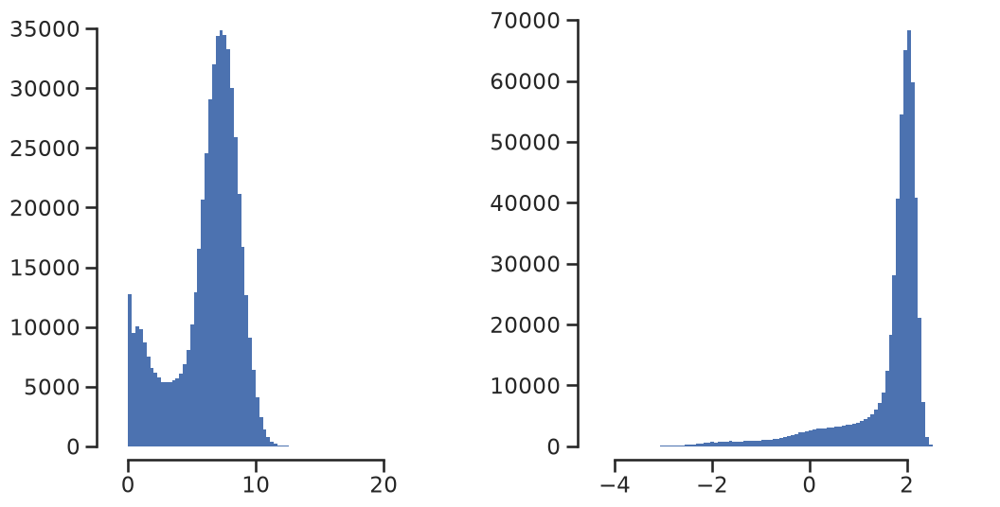

In [73]:
with vizutils.apply_plot_style():
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].hist(speed, edgecolor='none', bins=100)
    axs[1].hist(np.log(np.maximum(speed, 1e-10)), edgecolor='none', bins=100)
plt.show()

# Eyeball raw speed vs kinematics, random low-speed trials

Select trials that (1) passed the `>=2Hz` peak_mean_freq gate (`power` is not `None`) and (2) contain at least one running window of `window_size` consecutive samples, somewhere within `period`, where speed stays below `speed_thresh` (same running-window logic as `kin.immobile_starts_before_event` / `drop_immobile_trials`) — i.e. trials the pipeline already believes were oscillating, to see what's left once we also demand a genuinely still stretch in the pre-perturbation baseline. For a handful of random trials from that subset, plot the kinematics (z-dim of each oscillating keypoint, `df_tr.bhv`) and the composite speed (norm of velocity across all oscillating-keypoint xyz dims, same as the `speed` used above) stacked on a shared time axis.

In [101]:
def _has_valid_sol_on(sol_on):
    # mirrors the validity check in dt.add_concat_perturb_time
    if sol_on is None:
        return False
    if isinstance(sol_on, float) and np.isnan(sol_on):
        return False
    if isinstance(sol_on, np.ndarray) and sol_on.size == 0:
        return False
    return True

trial_only = df_tr[
    (df_tr.trial_name == "trial")
    & df_tr.idx_sol_on.apply(_has_valid_sol_on)
    & df_tr.power.apply(lambda x: isinstance(x, np.ndarray))  # passed the >=2Hz gate
]

speed_thresh = 3.5
period = (0, 200)  # (start, end) sample range to search within
window_size = 50  # consecutive below-thresh samples required

def _has_low_speed_window(row):
    # True if some window_size-long run within `period` stays below speed_thresh
    # (reuses the same helper drop_immobile_trials uses in tools/kinematics/utils.py)
    return kin.immobile_starts_before_event(
        row.bhv, thresh=speed_thresh, event_onset=period, win=window_size
    )

low_speed_mask = trial_only.apply(_has_low_speed_window, axis=1)
low_speed_trials = trial_only[low_speed_mask]
print(
    f"{len(trial_only)} trials pass the >=2Hz gate (power is not None); "
    f"of those, {len(low_speed_trials)} have at least one {window_size}-sample window "
    f"with speed < {speed_thresh} within samples {period}"
)

rng = np.random.default_rng(0)
n_random = min(10, len(low_speed_trials))
random_ids = rng.choice(low_speed_trials.index, size=n_random, replace=False)
print(f"Randomly selected trial indices: {list(random_ids)}")

440 trials pass the >=2Hz gate (power is not None); of those, 46 have at least one 50-sample window with speed < 3.5 within samples (0, 200)
Randomly selected trial indices: [np.int64(580), np.int64(720), np.int64(432), np.int64(388), np.int64(244), np.int64(28), np.int64(18), np.int64(294), np.int64(222), np.int64(114)]


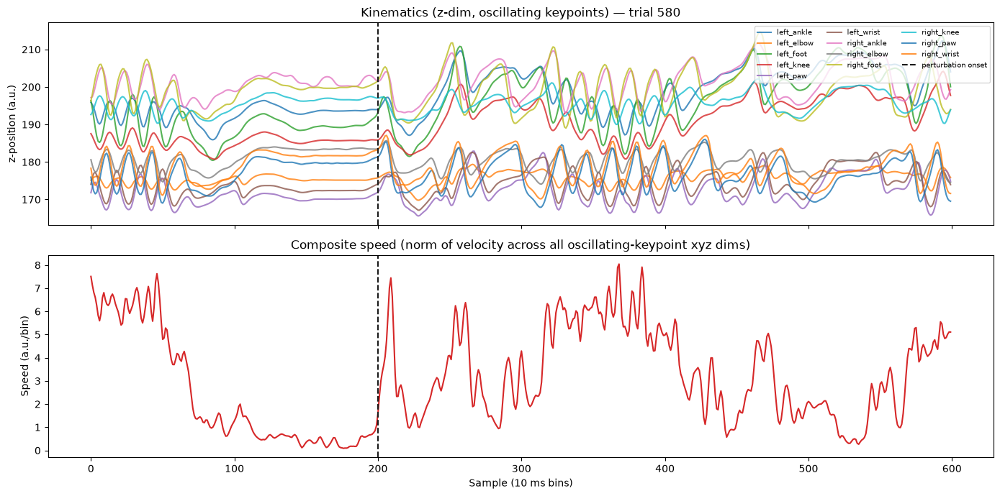

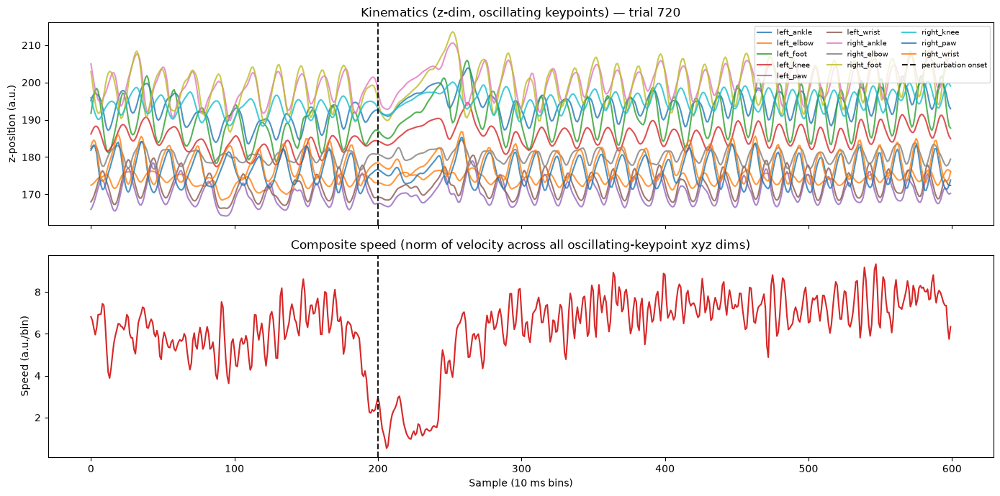

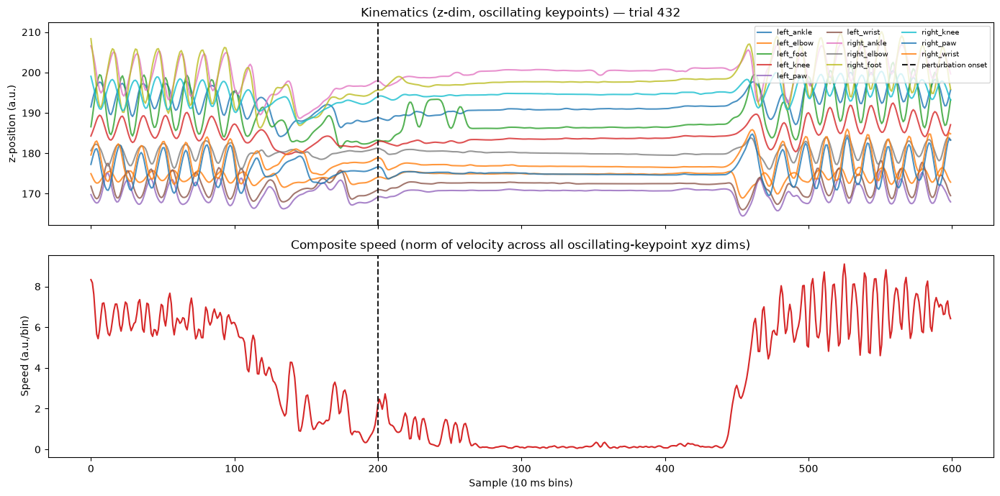

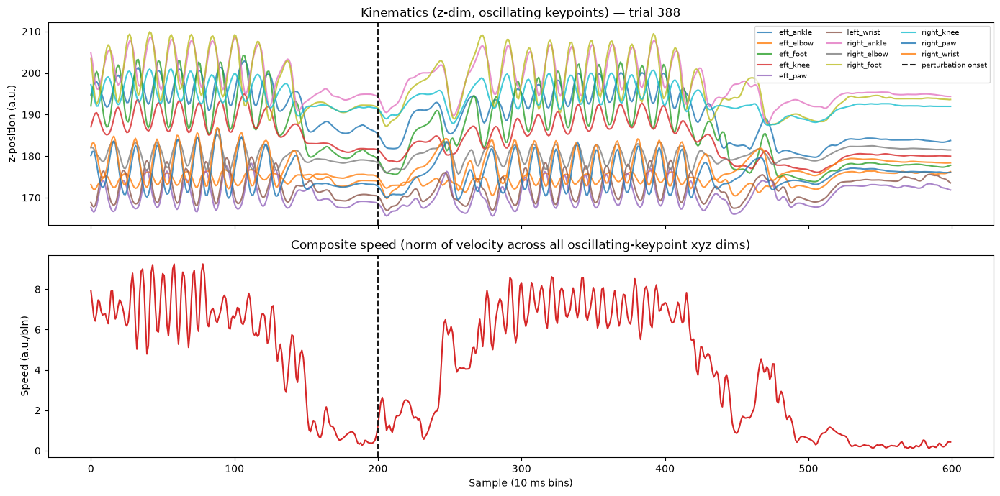

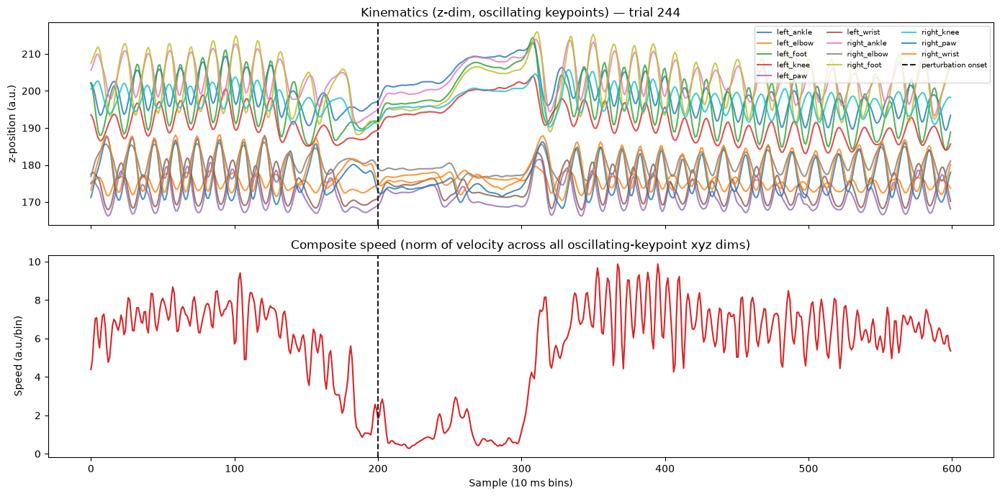

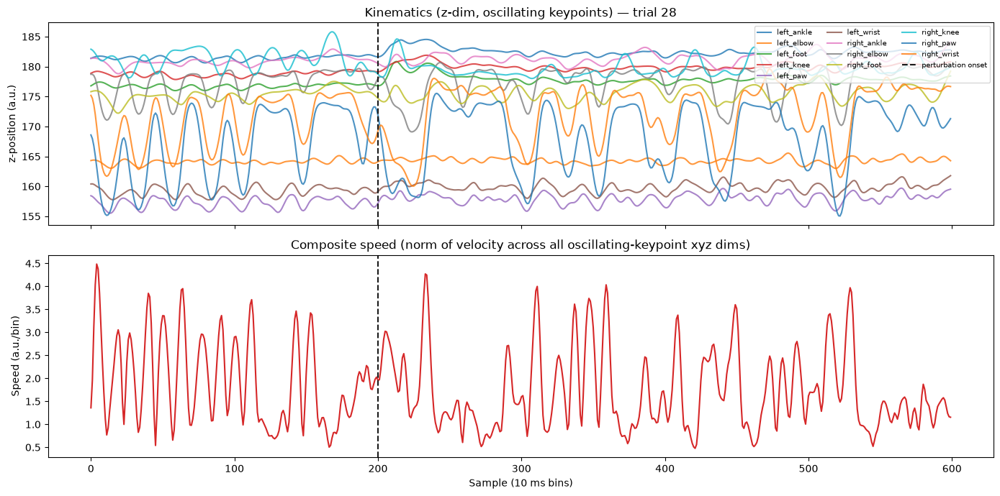

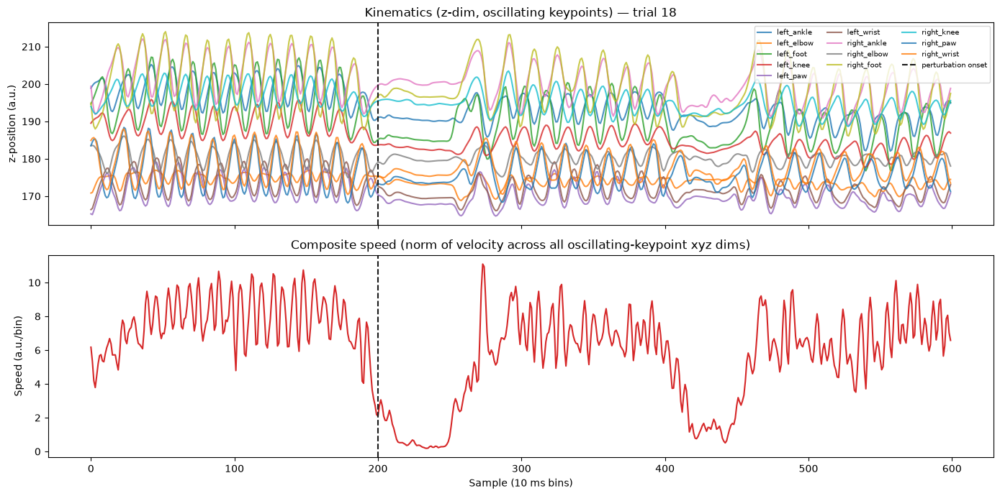

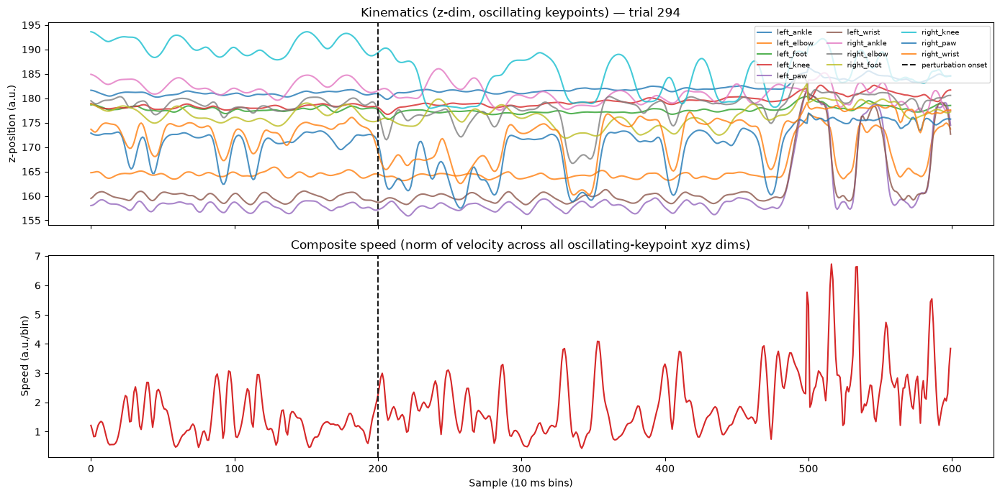

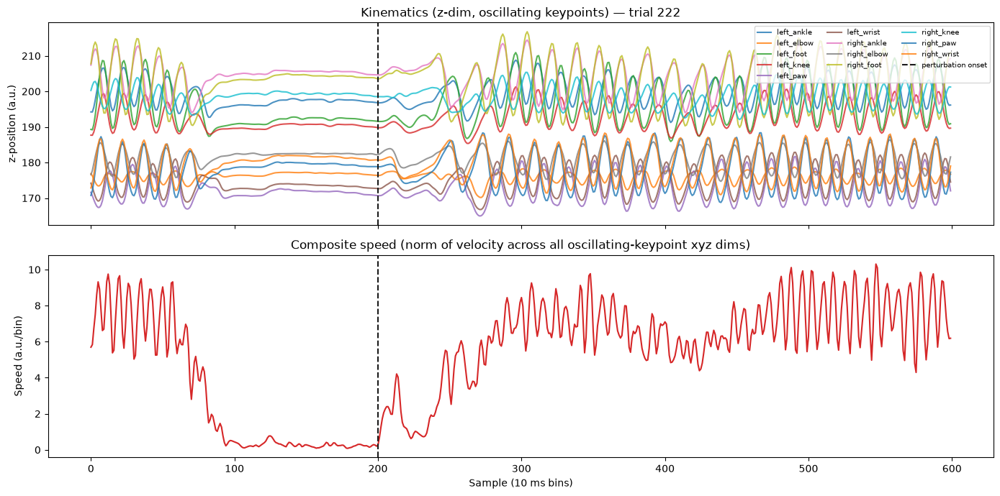

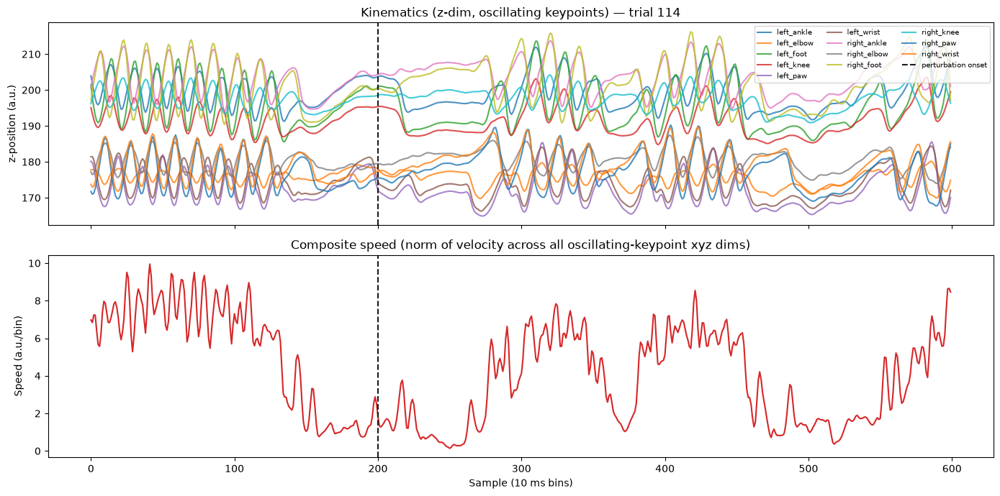

In [102]:
def _sol_on_int(row):
    sol_on = row.idx_sol_on
    if isinstance(sol_on, np.ndarray):
        sol_on = sol_on.item() if sol_on.size == 1 else sol_on[0]
    return int(sol_on)


z_col_idx = np.arange(start=2, stop=len(Params.oscillating_keypoints) * 3, step=3)

for tr_id in random_ids:
    row = df_tr.loc[tr_id]
    perturb_idx = _sol_on_int(row)

    vel = np.gradient(row.bhv, axis=0)
    speed = np.linalg.norm(vel, axis=1)

    fig, axs = plt.subplots(2, 1, figsize=(14, 7), sharex=True)

    for i, kp in zip(z_col_idx, Params.oscillating_keypoints):
        axs[0].plot(row.bhv[:, i], label=kp, alpha=0.8)
    axs[0].axvline(perturb_idx, color="k", linestyle="--", label="perturbation onset")
    axs[0].set_ylabel("z-position (a.u.)")
    axs[0].set_title(f"Kinematics (z-dim, oscillating keypoints) — trial {tr_id}")
    axs[0].legend(loc="upper right", fontsize=7, ncol=3)

    axs[1].plot(speed, color="tab:red")
    axs[1].axvline(perturb_idx, color="k", linestyle="--")
    axs[1].set_xlabel("Sample (10 ms bins)")
    axs[1].set_ylabel("Speed (a.u./bin)")
    axs[1].set_title("Composite speed (norm of velocity across all oscillating-keypoint xyz dims)")

    plt.tight_layout()
    plt.show()

# Systematic threshold #4: 2-state Gaussian HMM (run/still)

Fit a 2-state Gaussian HMM (EM/Baum-Welch via `hmmlearn`) directly on raw per-trial speed (not log — the raw histogram earlier already showed a well-behaved bimodal shape, and logging it smeared that out). Unlike a static Otsu/GMM threshold, the HMM learns the emission distributions (which implies a threshold, via the posterior crossover) *and* the temporal persistence (state dwell times) jointly, in one fit — replacing the current separate "static threshold + N-consecutive-bins" logic in `drop_immobile_trials` with something that learns both pieces from the data.

In [103]:
import scipy.stats
from hmmlearn.hmm import GaussianHMM

trial_td = df_tr[df_tr.trial_name == "trial"].copy()

sequences, lengths, seq_trial_ids = [], [], []
for idx, row in trial_td.iterrows():
    bhv = row.bhv
    if not isinstance(bhv, np.ndarray) or bhv.shape[0] < 2:
        continue
    vel = np.gradient(bhv, axis=0)
    speed = np.linalg.norm(vel, axis=1)
    sequences.append(speed)
    lengths.append(len(speed))
    seq_trial_ids.append(idx)

lengths = np.array(lengths)
X = np.concatenate(sequences).reshape(-1, 1)
print(f"Fitting HMM on {len(sequences)} / {len(trial_td)} trials, {X.shape[0]} total samples")

hmm_model = GaussianHMM(
    n_components=2, covariance_type="diag", n_iter=200, tol=1e-4, random_state=0
)
hmm_model.fit(X, lengths=lengths)
print(f"Converged: {hmm_model.monitor_.converged} after {hmm_model.monitor_.iter} EM iterations")

Fitting HMM on 499 / 499 trials, 299400 total samples
Converged: True after 26 EM iterations


In [104]:
still_state = int(np.argmin(hmm_model.means_[:, 0]))
run_state = 1 - still_state

means = hmm_model.means_[:, 0]
stds = np.sqrt(hmm_model.covars_[:, 0, 0])
A = hmm_model.transmat_
stationary = hmm_model.get_stationary_distribution()

bin_size_s = 0.01  # bhv/speed here is at raw 10 ms bins

dwell_still = 1 / (1 - A[still_state, still_state])
dwell_run = 1 / (1 - A[run_state, run_state])

print("Learnt emission parameters (raw speed units):")
print(f"  still (state {still_state}): mean={means[still_state]:6.3f}  std={stds[still_state]:6.3f}  "
      f"stationary_p={stationary[still_state]:.3f}")
print(f"  run   (state {run_state}): mean={means[run_state]:6.3f}  std={stds[run_state]:6.3f}  "
      f"stationary_p={stationary[run_state]:.3f}")

print("\nTransition matrix (rows=from, cols=to):")
print(np.round(A, 4))

print("\nPersistence (expected dwell time from self-transition prob, 1/(1-p_self)):")
print(f"  still: {dwell_still:6.1f} bins  ({dwell_still * bin_size_s * 1000:6.0f} ms)")
print(f"  run:   {dwell_run:6.1f} bins  ({dwell_run * bin_size_s * 1000:6.0f} ms)")

Learnt emission parameters (raw speed units):
  still (state 1): mean= 2.183  std= 1.538  stationary_p=0.224
  run   (state 0): mean= 7.310  std= 1.276  stationary_p=0.776

Transition matrix (rows=from, cols=to):
[[0.9955 0.0045]
 [0.0157 0.9843]]

Persistence (expected dwell time from self-transition prob, 1/(1-p_self)):
  still:   63.9 bins  (   639 ms)
  run:    220.8 bins  (  2208 ms)


In [105]:
states_flat = hmm_model.predict(X, lengths=lengths)
states_per_trial = np.split(states_flat, np.cumsum(lengths)[:-1])

def _hmm_flags_immobile(is_still, event_onset=(100, 200), win=5):
    # same running-window logic as kin.starts_of_below_thresh_windows /
    # immobile_starts_before_event, applied to the decoded state sequence
    # instead of a static speed threshold
    if len(is_still) <= win:
        return False
    counts = np.convolve(is_still.astype(np.int32), np.ones(win, dtype=np.int32), mode="valid")
    starts = np.flatnonzero(counts == win)
    return np.any((starts > event_onset[0]) & (starts < event_onset[1]))

pre_perturb_window = (100, 200)
min_immobile_bins = 5

hmm_immobile_mask = np.array([
    _hmm_flags_immobile(s == still_state, event_onset=pre_perturb_window, win=min_immobile_bins)
    for s in states_per_trial
])

n_total = len(sequences)
n_dropped_hmm = int(hmm_immobile_mask.sum())
print(
    f"HMM-based: {n_dropped_hmm} / {n_total} trials flagged immobile "
    f"({n_dropped_hmm / n_total:.1%}), pre_perturb_window={pre_perturb_window}, "
    f"min_immobile_bins={min_immobile_bins}"
)

# compare against the existing Otsu-based method (same pre_perturb_window/min_immobile_bins)
otsu_kept = kin.drop_immobile_trials(
    trial_td, pre_perturb_window=pre_perturb_window, min_immobile_bins=min_immobile_bins
)
n_dropped_otsu = len(trial_td) - len(otsu_kept)
print(
    f"Otsu-based (existing drop_immobile_trials): {n_dropped_otsu} / {len(trial_td)} "
    f"trials dropped ({n_dropped_otsu / len(trial_td):.1%})"
)

hmm_flag_by_id = dict(zip(seq_trial_ids, hmm_immobile_mask))
otsu_immobile_ids = set(trial_td.index) - set(otsu_kept.index)
common_ids = [i for i in seq_trial_ids if i in trial_td.index]
agreement = np.mean([hmm_flag_by_id[i] == (i in otsu_immobile_ids) for i in common_ids])
print(f"Agreement between the two methods' flagged trials: {agreement:.1%} (n={len(common_ids)})")

HMM-based: 184 / 499 trials flagged immobile (36.9%), pre_perturb_window=(100, 200), min_immobile_bins=5
Otsu immobility threshold: 2.2123
Dropped 130 of 499 rows (26.05%).
Otsu-based (existing drop_immobile_trials): 130 / 499 trials dropped (26.1%)
Agreement between the two methods' flagged trials: 89.2% (n=499)


HMM effective threshold (stationary-weighted posterior crossover): 4.450


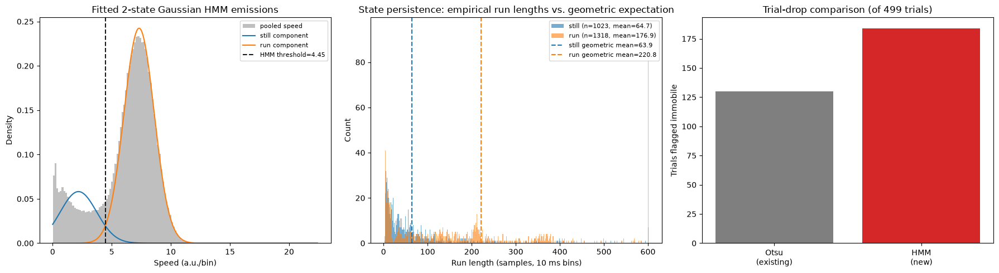

In [106]:
grid = np.linspace(0, X.max(), 2000)
logpdf_still = scipy.stats.norm.logpdf(grid, means[still_state], stds[still_state])
logpdf_run = scipy.stats.norm.logpdf(grid, means[run_state], stds[run_state])
weighted_still = np.log(stationary[still_state]) + logpdf_still
weighted_run = np.log(stationary[run_state]) + logpdf_run
hmm_threshold = grid[np.argmin(np.abs(weighted_still - weighted_run))]
print(f"HMM effective threshold (stationary-weighted posterior crossover): {hmm_threshold:.3f}")


def _run_lengths(states, target):
    out, count = [], 0
    for s in states:
        if s == target:
            count += 1
        else:
            if count > 0:
                out.append(count)
            count = 0
    if count > 0:
        out.append(count)
    return out


still_runs = np.concatenate([_run_lengths(s, still_state) for s in states_per_trial])
run_runs = np.concatenate([_run_lengths(s, run_state) for s in states_per_trial])

max_run_for_bins = int(np.percentile(np.concatenate([still_runs, run_runs]), 99)) + 2
bins_persist = np.arange(1, max_run_for_bins + 1)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))

axs[0].hist(X[:, 0], bins=150, density=True, alpha=0.5, color="gray", label="pooled speed")
axs[0].plot(grid, stationary[still_state] * np.exp(logpdf_still), color="tab:blue", label="still component")
axs[0].plot(grid, stationary[run_state] * np.exp(logpdf_run), color="tab:orange", label="run component")
axs[0].axvline(hmm_threshold, color="k", linestyle="--", label=f"HMM threshold={hmm_threshold:.2f}")
axs[0].set_xlabel("Speed (a.u./bin)")
axs[0].set_ylabel("Density")
axs[0].set_title("Fitted 2-state Gaussian HMM emissions")
axs[0].legend(fontsize=8)

axs[1].hist(still_runs, bins=bins_persist, alpha=0.6, color="tab:blue",
            label=f"still (n={len(still_runs)}, mean={still_runs.mean():.1f})")
axs[1].hist(run_runs, bins=bins_persist, alpha=0.6, color="tab:orange",
            label=f"run (n={len(run_runs)}, mean={run_runs.mean():.1f})")
axs[1].axvline(dwell_still, color="tab:blue", linestyle="--", label=f"still geometric mean={dwell_still:.1f}")
axs[1].axvline(dwell_run, color="tab:orange", linestyle="--", label=f"run geometric mean={dwell_run:.1f}")
axs[1].set_xlabel("Run length (samples, 10 ms bins)")
axs[1].set_ylabel("Count")
axs[1].set_title("State persistence: empirical run lengths vs. geometric expectation")
axs[1].legend(fontsize=8)

axs[2].bar(["Otsu\n(existing)", "HMM\n(new)"], [n_dropped_otsu, n_dropped_hmm], color=["tab:gray", "tab:red"])
axs[2].set_ylabel("Trials flagged immobile")
axs[2].set_title(f"Trial-drop comparison (of {len(trial_td)} trials)")

plt.tight_layout()
plt.show()

In [16]:
trial_td.shape

(440, 84)

# Sanity check: GMM (running-component 95%) vs Otsu threshold, visualised on low-speed trials

Two candidate immobility thresholds, computed on the same pooled speed (`trial_name == 'trial'` rows only, matching what `kin.drop_immobile_trials` pools in production):

- **GMM**: fit a 2-component Gaussian mixture to raw speed, take the higher-mean ("running") component, set the threshold at its 5th percentile (i.e. the point below which only ~5% of genuine running samples would fall — "95% of running mass lies above this point").
- **Otsu**: `kin.otsu_threshold` on log-speed, exponentiated back — exactly what `drop_immobile_trials` does today.

Both are then overlaid on the same random sample of low-speed trials so they can be compared visually.

In [4]:
SESSIONS = [
    # "M061_2025_03_06_14_00",
    # "M103_2026_02_18_15_30",
    # "M103_2026_02_20_16_00",
    "M106_2026_02_25_15_00",
    # "M106_2026_02_27_16_00",
    # 'M086_2025_12_11_15_00',
    # 'M086_2025_12_10_15_00'
]
session = SESSIONS[0]
# td, _ = dsp.load_and_process_session(SESSIONS[0], std=0.03)
df = pyal.load_pyaldata("C:/data/raw/" + SESSIONS[0][:4] + "/" + SESSIONS[0])
df = dsp.preprocess(df, only_trials=False, combine_time_bins=False, std=0.03)
df_tr = kin.compute_perturb_score(
    df, 
    on_keypoints=Params.oscillating_keypoints
)
# df_tr = pyal.select_trials(df_tr, df_tr.trial_name == "trial")

trial_td = dt.add_bhv(df_tr, bhv_fields=Params.oscillating_keypoints)
trial_td = pyal.select_trials(trial_td, df_tr.trial_name == 'trial')
trial_td = trial_td[trial_td["power"].apply(lambda x: isinstance(x, np.ndarray))]

C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\data_cleaning.py:120: UserWarning: fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
  utils.warnings.warn(f"fields: {bad_fields} could not be converted to int.")
C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\data_cleaning.py:120: UserWarning: fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
  utils.warnings.warn(f"fields: {bad_fields} could not be converted to int.")
C:\Users\MartinEsparzaINBRAIN\repos\pyaldata\pyaldata\data_cleaning.py:120: UserWarning: fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
  utils.warnings.warn(f"fields: {bad_fields} could not be converted to int.")
C:\

['CP_spikes', 'MOp_spikes', 'all_spikes', 'VAL_spikes', 'SSp_spikes']
Resulting CP_spikes ephys data shape is (NxT): (206, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (156, 48000)
Resulting all_spikes ephys data shape is (NxT): (11, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (132, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (142, 48000)
bhv column not found adding it
add_concat_perturb_time: dropping 1 trial(s) with missing idx_sol_on
compute_power_in_bhv_concat_td: dropping 73 trial(s) with peak_mean_freq < 2 Hz
bhv field already present, overwriting it


In [8]:
# Pool speed across trial_name == 'trial' rows only (matches kin.drop_immobile_trials / production,
# unlike the earlier `speed` variable in this notebook which pooled all trial types)
vel_trials_only = np.gradient(np.concatenate(trial_td.bhv.values), axis=0)
speed_trials_only = np.linalg.norm(vel_trials_only, axis=1)
print(f"Pooled speed from {len(trial_td)} trials, {speed_trials_only.shape[0]} samples")

Pooled speed from 426 trials, 255600 samples


## GMM approach — fit 2-component GMM, take the higher-mean ("running") component, threshold at its 5th percentile

In [22]:
from sklearn.mixture import GaussianMixture
import scipy.stats

# Fit in log-speed (not raw speed): raw speed is heavily right-skewed, so an unconstrained
# 2-component GMM tends to spend both Gaussians splitting the dominant skewed running mode
# instead of isolating the small near-zero stillness bump. Log-space symmetrizes this,
# matching what assess_bimodality/otsu_threshold already do elsewhere in this codebase.
log_speed_trials_only = np.log(np.maximum(speed_trials_only, 1e-10))

gmm = GaussianMixture(n_components=2, covariance_type="full", n_init=10, random_state=0)
gmm.fit(log_speed_trials_only.reshape(-1, 1))

gmm_means_log = gmm.means_.ravel()
gmm_stds_log = np.sqrt(gmm.covariances_.ravel())
run_comp = np.argmax(gmm_means_log)
still_comp = 1 - run_comp

# Threshold = 5th percentile of the running component's fitted Gaussian (in log-space),
# exponentiated back to raw speed units — the speed below which only ~5% of genuine
# running samples would fall ("95% of running mass lies above this point")
gmm_thresh_log = scipy.stats.norm.ppf(0.05, loc=gmm_means_log[run_comp], scale=gmm_stds_log[run_comp])
gmm_thresh = np.exp(gmm_thresh_log)

print(f"GMM component means (log-space): still={gmm_means_log[still_comp]:.3f}, run={gmm_means_log[run_comp]:.3f}")
print(f"GMM component means (raw speed):  still={np.exp(gmm_means_log[still_comp]):.3f}, run={np.exp(gmm_means_log[run_comp]):.3f}")
print(f"GMM threshold (95% of running mass above): {gmm_thresh:.3f} raw (log={gmm_thresh_log:.3f})")

GMM component means (log-space): still=2.738, run=3.233
GMM component means (raw speed):  still=15.456, run=25.368
GMM threshold (95% of running mass above): 17.188 raw (log=2.844)


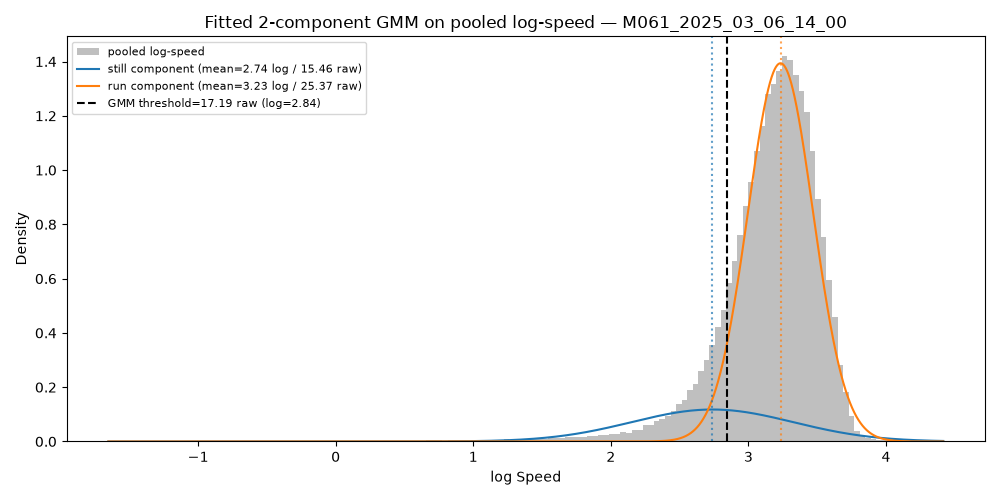

In [23]:
# Visual check: pooled log-speed histogram vs. the two fitted GMM components and their means
gmm_weights = gmm.weights_.ravel()

grid = np.linspace(log_speed_trials_only.min(), log_speed_trials_only.max(), 2000)
pdf_still = gmm_weights[still_comp] * scipy.stats.norm.pdf(grid, gmm_means_log[still_comp], gmm_stds_log[still_comp])
pdf_run = gmm_weights[run_comp] * scipy.stats.norm.pdf(grid, gmm_means_log[run_comp], gmm_stds_log[run_comp])

fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(log_speed_trials_only, bins=150, density=True, alpha=0.5, color="gray", label="pooled log-speed")
ax.plot(grid, pdf_still, color="tab:blue",
        label=f"still component (mean={gmm_means_log[still_comp]:.2f} log / {np.exp(gmm_means_log[still_comp]):.2f} raw)")
ax.plot(grid, pdf_run, color="tab:orange",
        label=f"run component (mean={gmm_means_log[run_comp]:.2f} log / {np.exp(gmm_means_log[run_comp]):.2f} raw)")
ax.axvline(gmm_means_log[still_comp], color="tab:blue", linestyle=":", alpha=0.7)
ax.axvline(gmm_means_log[run_comp], color="tab:orange", linestyle=":", alpha=0.7)
ax.axvline(gmm_thresh_log, color="k", linestyle="--", label=f"GMM threshold={gmm_thresh:.2f} raw (log={gmm_thresh_log:.2f})")
ax.set_xlabel("log Speed")
ax.set_ylabel("Density")
ax.set_title(f"Fitted 2-component GMM on pooled log-speed — {SESSIONS[0]}")
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

## Otsu approach (same as `kin.otsu_threshold`, used in `drop_immobile_trials`)

In [9]:
log_speed_trials_only = np.log(np.maximum(speed_trials_only, 1e-10))
otsu_thresh_log = kin.otsu_threshold(log_speed_trials_only)
otsu_thresh = np.exp(otsu_thresh_log)
print(f"Otsu threshold (log-space): {otsu_thresh_log:.3f}")
print(f"Otsu threshold (raw speed): {otsu_thresh:.3f}")

Otsu threshold (log-space): 0.763
Otsu threshold (raw speed): 2.146


kin.otsu_threshold output: 0.7634
argmax of plotted curve:   0.7634


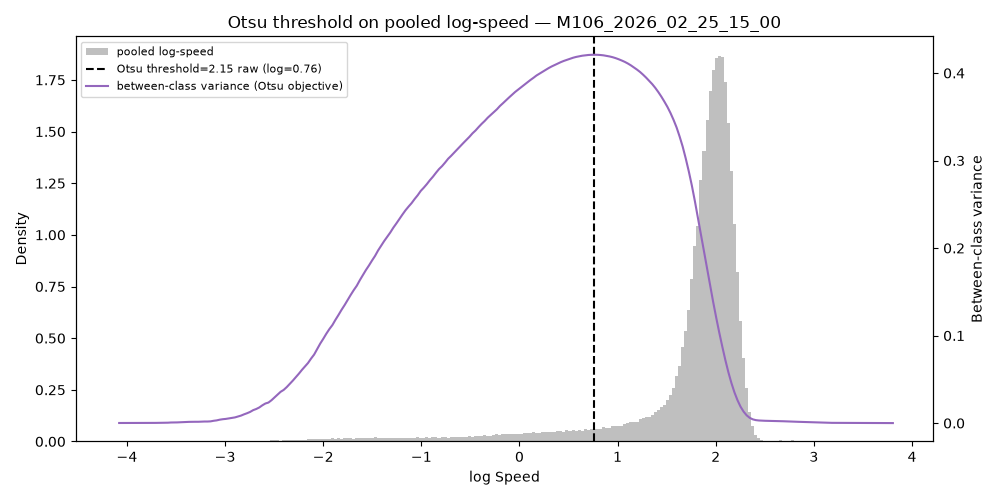

In [83]:
# Visual check: pooled log-speed histogram with the Otsu threshold, plus the
# between-class variance curve Otsu actually maximises to pick that point.
# The threshold is derived directly from this curve (not from the earlier cell's
# otsu_thresh_log) so the dashed line is guaranteed to sit at the curve's own peak
# even if cells get re-run out of order.
_bins = 256
_hist, _edges = np.histogram(log_speed_trials_only, bins=_bins)
_centers = 0.5 * (_edges[:-1] + _edges[1:])
_hist_norm = _hist.astype(float) / _hist.sum()

_cumsum = np.cumsum(_hist_norm)
_cummean = np.cumsum(_hist_norm * _centers)

_between_var = np.full(len(_centers), np.nan)
for _i in range(1, len(_centers)):
    _w0 = _cumsum[_i - 1]
    _w1 = 1.0 - _w0
    if _w0 == 0 or _w1 == 0:
        continue
    _mu0 = _cummean[_i - 1] / _w0
    _mu1 = (_cummean[-1] - _cummean[_i - 1]) / _w1
    _between_var[_i] = _w0 * _w1 * (_mu0 - _mu1) ** 2

_argmax = np.nanargmax(_between_var)
otsu_thresh_log_check = _centers[_argmax]

# sanity check against kin.otsu_threshold's own output (computed in the cell above);
# should match to within one bin width if both used the same log_speed_trials_only
print(f"kin.otsu_threshold output: {otsu_thresh_log:.4f}")
print(f"argmax of plotted curve:   {otsu_thresh_log_check:.4f}")
if not np.isclose(otsu_thresh_log, otsu_thresh_log_check, atol=(_centers[1] - _centers[0])):
    print("MISMATCH — rerun the Otsu threshold cell above, then this cell, back-to-back "
          "(likely stale variables from out-of-order execution).")

fig, ax1 = plt.subplots(figsize=(10, 5))
ax1.hist(log_speed_trials_only, bins=_bins, density=True, alpha=0.5, color="gray", label="pooled log-speed")
ax1.axvline(otsu_thresh_log_check, color="k", linestyle="--",
            label=f"Otsu threshold={np.exp(otsu_thresh_log_check):.2f} raw (log={otsu_thresh_log_check:.2f})")
ax1.set_xlabel("log Speed")
ax1.set_ylabel("Density")

ax2 = ax1.twinx()
ax2.plot(_centers, _between_var, color="tab:purple", lw=1.5, label="between-class variance (Otsu objective)")
ax2.set_ylabel("Between-class variance")

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, fontsize=8, loc="upper left")

ax1.set_title(f"Otsu threshold on pooled log-speed — {session}")
plt.tight_layout()
plt.show()

## Select 10 random low-speed trials for visual comparison

Trials drawn from the bottom 20% by per-trial minimum speed, so we're actually looking at trials that contain a low-speed stretch.

In [81]:
per_trial_min_speed, per_trial_ids = [], []
for idx, row in trial_td.iterrows():
    vel_tr = np.gradient(row.bhv, axis=0)
    speed_tr = np.linalg.norm(vel_tr, axis=1)
    per_trial_min_speed.append(speed_tr.min())
    per_trial_ids.append(idx)

per_trial_min_speed = np.array(per_trial_min_speed)
per_trial_ids = np.array(per_trial_ids)

low_speed_cutoff = np.percentile(per_trial_min_speed, 10)
low_speed_candidate_ids = per_trial_ids[per_trial_min_speed <= low_speed_cutoff]

rng = np.random.default_rng(0)
n_random = min(10, len(low_speed_candidate_ids))
random_low_speed_ids = rng.choice(low_speed_candidate_ids, size=n_random, replace=False)
print(f"{len(low_speed_candidate_ids)} trials in bottom 20% by min speed; "
      f"showing {n_random} random ones: {list(random_low_speed_ids)}")

32 trials in bottom 20% by min speed; showing 10 random ones: [np.int64(131), np.int64(232), np.int64(101), np.int64(73), np.int64(49), np.int64(20), np.int64(4), np.int64(64), np.int64(42), np.int64(21)]


## Plotting helper

In [72]:
def _sol_on_int(row):
    sol_on = row.idx_sol_on
    if isinstance(sol_on, np.ndarray):
        sol_on = sol_on.item() if sol_on.size == 1 else sol_on[0]
    return int(sol_on)


def plot_trials_with_threshold(trial_ids, thresholds, title, keypoints=Params.oscillating_keypoints):
    # thresholds: dict {label: value}, each drawn as its own horizontal line so multiple
    # methods can be compared on the exact same set of trials in one figure
    thresh_colors = {"GMM": "tab:green", "Otsu": "black"}

    # z-dim column of each oscillating keypoint in `bhv` (same convention as the trial scroller above)
    z_col_idx = np.arange(start=2, stop=len(keypoints) * 3, step=3)

    n = len(trial_ids)
    ncols = 2
    nrows_trials = int(np.ceil(n / ncols))
    fig, axs = plt.subplots(
        nrows_trials * 2, ncols, figsize=(14, 4 * nrows_trials), sharex=False,
        gridspec_kw={"height_ratios": [2, 1] * nrows_trials},
    )
    axs = np.atleast_2d(axs)

    for i, tr_id in enumerate(trial_ids):
        block, col = divmod(i, ncols)
        ax_kin = axs[block * 2, col]
        ax_speed = axs[block * 2 + 1, col]

        row = trial_td.loc[tr_id]
        vel_tr = np.gradient(row.bhv, axis=0)
        speed_tr = np.linalg.norm(vel_tr, axis=1)
        perturb_idx = _sol_on_int(row)

        # raw kinematics (z-dim, oscillating keypoints) for visual validation against the speed trace
        for z_idx, kp in zip(z_col_idx, keypoints):
            ax_kin.plot(row.bhv[:, z_idx], label=kp, alpha=0.7, lw=0.8)
        ax_kin.axvline(perturb_idx, color="k", linestyle="--")
        ax_kin.set_title(f"trial {tr_id}", fontsize=9)
        ax_kin.set_ylabel("z-position")
        ax_kin.tick_params(labelbottom=False)

        ax_speed.plot(speed_tr, color="tab:red", lw=1)
        for label, thresh in thresholds.items():
            ax_speed.axhline(
                thresh, color=thresh_colors.get(label, "k"), linestyle="--",
                label=f"{label} thresh={thresh:.2f}",
            )
        ax_speed.axvline(perturb_idx, color="tab:blue", linestyle=":", label="perturbation")
        ax_speed.set_ylabel("speed")
        ax_speed.set_xlabel("sample (10 ms bins)")

    # hide unused axes if n isn't a multiple of ncols
    for j in range(n, nrows_trials * ncols):
        block, col = divmod(j, ncols)
        axs[block * 2, col].axis("off")
        axs[block * 2 + 1, col].axis("off")

    axs[0, 0].legend(fontsize=6, ncol=2, loc="upper right")
    axs[1, 0].legend(fontsize=8, loc="upper right")
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

## GMM vs Otsu threshold overlay (same trials)

Both thresholds drawn on the same set of trials in one figure, so there's no risk of the two comparisons silently drifting apart across separate cells/re-runs.

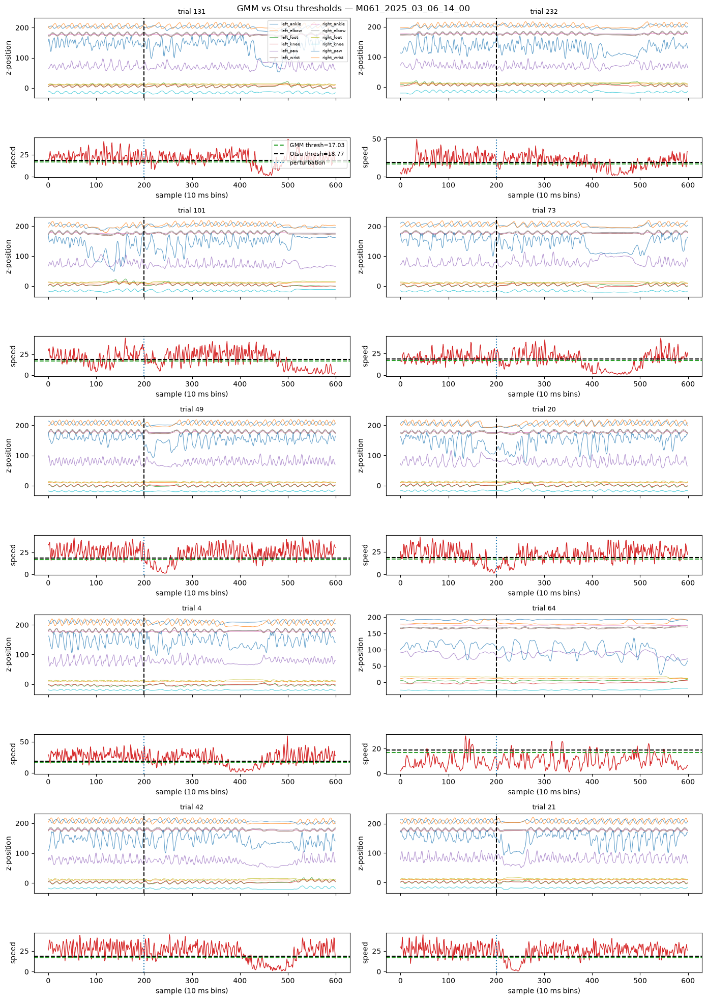

In [ ]:
plot_trials_with_threshold(
    random_low_speed_ids,
    {"GMM": gmm_thresh, "Otsu": otsu_thresh},
    f"GMM vs Otsu thresholds — {session}"
)

## Sweep immobile parameter

In [85]:
trial_td.shape

(316, 89)

Otsu immobility threshold: 10.4221
Dropped 89 of 426 rows (20.89%).


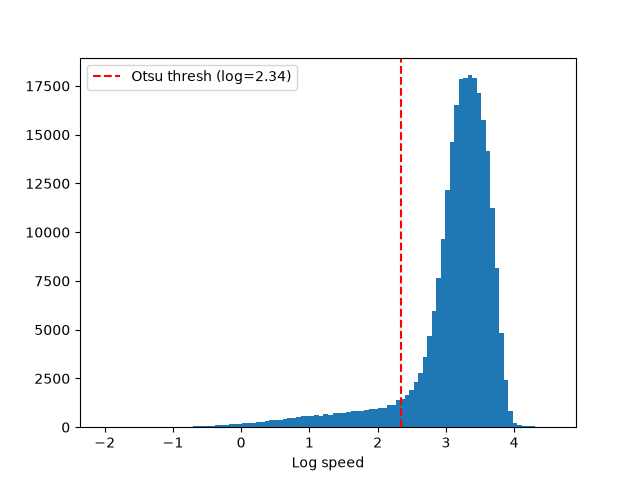

In [79]:
_, dropped_count = kin.drop_immobile_trials(
    trial_td, 
    min_immobile_bins=5,
    plot=True,
    return_dropped_count=True)

In [97]:
bins = np.arange(1, 50, step=2)
dropped = []
for bin in bins:
    _, dropped_count = kin.drop_immobile_trials(
        trial_td, 
        min_immobile_bins=bin, 
        return_dropped_count=True)
    dropped.append(dropped_count)

Otsu immobility threshold: 18.7671
Dropped 316 of 316 rows (100.00%).
Otsu immobility threshold: 18.7671
Dropped 216 of 316 rows (68.35%).
Otsu immobility threshold: 18.7671
Dropped 95 of 316 rows (30.06%).
Otsu immobility threshold: 18.7671
Dropped 57 of 316 rows (18.04%).
Otsu immobility threshold: 18.7671
Dropped 42 of 316 rows (13.29%).
Otsu immobility threshold: 18.7671
Dropped 36 of 316 rows (11.39%).
Otsu immobility threshold: 18.7671
Dropped 31 of 316 rows (9.81%).
Otsu immobility threshold: 18.7671
Dropped 29 of 316 rows (9.18%).
Otsu immobility threshold: 18.7671
Dropped 26 of 316 rows (8.23%).
Otsu immobility threshold: 18.7671
Dropped 26 of 316 rows (8.23%).
Otsu immobility threshold: 18.7671
Dropped 25 of 316 rows (7.91%).
Otsu immobility threshold: 18.7671
Dropped 23 of 316 rows (7.28%).
Otsu immobility threshold: 18.7671
Dropped 22 of 316 rows (6.96%).
Otsu immobility threshold: 18.7671
Dropped 21 of 316 rows (6.65%).
Otsu immobility threshold: 18.7671
Dropped 19 of 316 

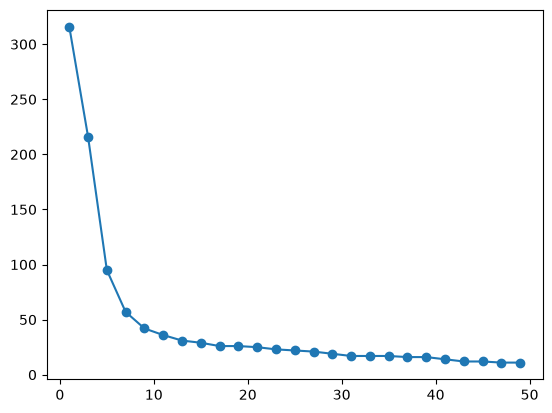

In [98]:
plt.plot(bins, dropped, '-o')

## Change threshold method

In [101]:
vel_trials_only = np.gradient(np.concatenate(trial_td.bhv.values), axis=0)
speed_trials_only = np.linalg.norm(vel_trials_only, axis=1)

In [103]:
vel_trials_only.shape

(189601, 62)

In [ ]:
def _is_trial_below_otsu_thresh(bhv, otsu_thresh, std_thresh):
    vel = np.gradient((bhv), axis=0)
    speed = np.linalg.norm(vel, axis=1)[100:200]
    mean, std = speed.mean(), speed.std()
    if mean - std_thresh*std < otsu_thresh:
        return True
    else:
        return False
std_thresh = 0.5
tmp_df = trial_td["bhv"].apply(lambda x: _is_trial_below_otsu_thresh(x, otsu_thresh, std_thresh))
print(f'Dropped trials {tmp_df.sum() / trial_td.shape[0]}')

Dropped trials 0.1518987341772152


In [128]:
tmp_df.sum()

np.int64(294)

## Visual check: per-trial mean ± std vs. Otsu threshold

For a handful of example trials, plot the pre-perturbation-window speed's mean ± `std_thresh`·std as an errorbar against the Otsu threshold — the same comparison `_is_trial_above_otsu_thresh` makes per trial, just made visible. Green = passes (lower error bar clears the threshold), red = fails (dips at/below it).

In [121]:
def plot_mean_std_vs_otsu(trial_ids, otsu_thresh, std_thresh=1, window=(100, 200)):
    from matplotlib.lines import Line2D

    means, stds, colors = [], [], []
    for tr_id in trial_ids:
        row = trial_td.loc[tr_id]
        vel_tr = np.gradient(row.bhv, axis=0)
        speed_tr = np.linalg.norm(vel_tr, axis=1)[window[0]:window[1]]
        mean, std = speed_tr.mean(), speed_tr.std()
        means.append(mean)
        stds.append(std)
        colors.append("tab:green" if (mean - std_thresh * std) >= otsu_thresh else "tab:red")

    x = np.arange(len(trial_ids))
    fig, ax = plt.subplots(figsize=(10, 5))
    for xi, m, s, c in zip(x, means, stds, colors):
        ax.errorbar(xi, m, yerr=std_thresh * s, fmt="o", color=c, ecolor=c, capsize=4, alpha=0.85)

    ax.axhline(otsu_thresh, color="k", linestyle="--")
    ax.set_xticks(x)
    ax.set_xticklabels([str(t) for t in trial_ids], rotation=45, ha="right")
    ax.set_xlabel("trial id")
    ax.set_ylabel(f"speed, samples {window[0]}:{window[1]} (mean ± {std_thresh}·std)")
    ax.set_title(f"Per-trial mean ± {std_thresh}·std vs Otsu threshold — {session}")

    legend_elems = [
        Line2D([0], [0], marker="o", color="tab:green", linestyle="", label="passes (mean - k·std ≥ thresh)"),
        Line2D([0], [0], marker="o", color="tab:red", linestyle="", label="fails (mean - k·std < thresh)"),
        Line2D([0], [0], color="k", linestyle="--", label=f"Otsu threshold={otsu_thresh:.2f}"),
    ]
    ax.legend(handles=legend_elems, fontsize=8)
    plt.tight_layout()
    plt.show()

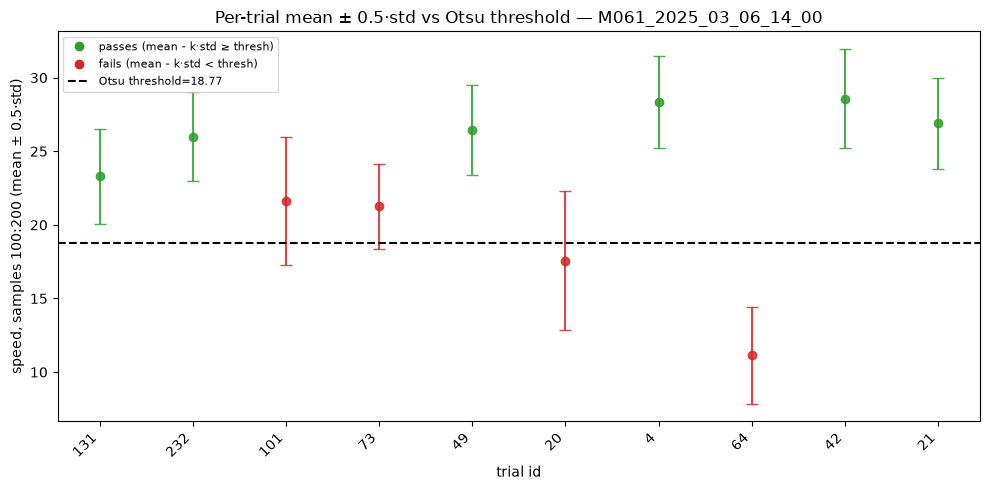

In [139]:
plot_mean_std_vs_otsu(random_low_speed_ids, otsu_thresh, std_thresh=0.5)

## Sweep std_thresh

`_is_trial_below_otsu_thresh` flags a trial once `mean - std_thresh*std < otsu_thresh`. Since `std >= 0`, `mean - std_thresh*std` only ever decreases as `std_thresh` grows, so this sweep is monotonic by construction — higher `std_thresh` can only flag more trials, never fewer. `std_thresh=0` is the strictest case (drop only if the trial's raw window mean is already below the Otsu threshold); larger values progressively let a trial's own low-end variability trigger a drop.

In [136]:
std_thresh_range = np.arange(0, 3.25, 0.25)
dropped_fracs = []
for st in std_thresh_range:
    tmp = trial_td["bhv"].apply(lambda x: _is_trial_below_otsu_thresh(x, otsu_thresh, st))
    dropped_fracs.append(tmp.sum() / trial_td.shape[0])

for st, frac in zip(std_thresh_range, dropped_fracs):
    print(f"std_thresh={st:.2f}: {frac:.1%} of trials dropped")

std_thresh=0.00: 7.0% of trials dropped
std_thresh=0.25: 9.2% of trials dropped
std_thresh=0.50: 15.2% of trials dropped
std_thresh=0.75: 24.1% of trials dropped
std_thresh=1.00: 43.0% of trials dropped
std_thresh=1.25: 71.5% of trials dropped
std_thresh=1.50: 93.7% of trials dropped
std_thresh=1.75: 98.4% of trials dropped
std_thresh=2.00: 100.0% of trials dropped
std_thresh=2.25: 100.0% of trials dropped
std_thresh=2.50: 100.0% of trials dropped
std_thresh=2.75: 100.0% of trials dropped
std_thresh=3.00: 100.0% of trials dropped


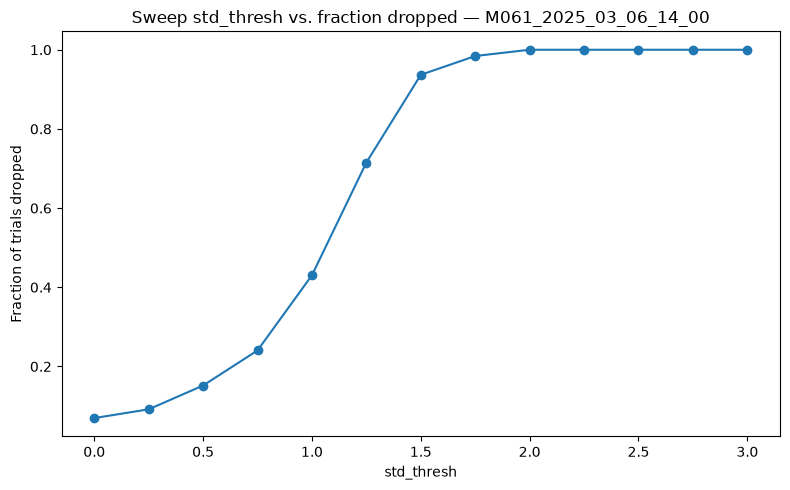

In [137]:
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(std_thresh_range, dropped_fracs, "-o")
ax.set_xlabel("std_thresh")
ax.set_ylabel("Fraction of trials dropped")
ax.set_title(f"Sweep std_thresh vs. fraction dropped — {session}")
plt.tight_layout()
plt.show()

# Create new way of dropping trials. 

bhv field already present, overwriting it


In [ ]:
# Switch to the ipympl interactive backend (pan/zoom toolbar on the figure itself).
# Run this once — it applies to every plot for the rest of this kernel session.
# `%matplotlib inline` switches back to static plots if needed.
# %matplotlib widget

bhv field already present, overwriting it


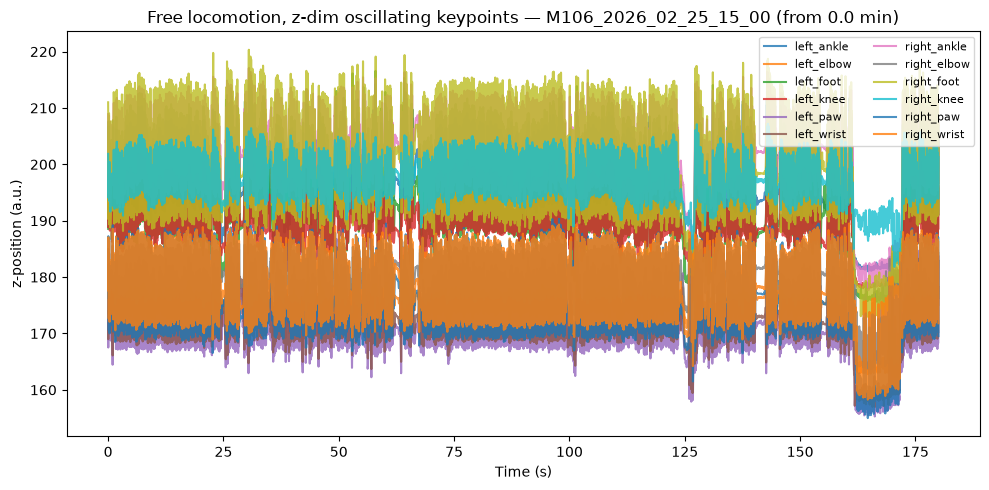

In [5]:
def plot_oscillating_keypoints_z(bhv, keypoints=Params.oscillating_keypoints, window_min=3, start_min=0, ax=None, title=None):
    """Plot the z-feature column of each oscillating keypoint from a bhv array, labelled —
    for eyeballing a stretch of steady locomotion to derive cv_thresh from.
    Interactive (ipympl / %matplotlib widget): use the figure's own zoom/pan toolbar to inspect
    closely, or change `start_min` and re-run to page through the trace."""
    fs = 100  # bhv is at 10 ms bins (100 Hz)
    z_col_idx = np.arange(start=2, stop=len(keypoints) * 3, step=3)

    start_sample = int(start_min * 60 * fs)
    if start_sample >= bhv.shape[0]:
        raise ValueError(
            f"start_min={start_min} is past the end of this trace "
            f"({bhv.shape[0] / 60 / fs:.1f} min long)"
        )
    end_sample = min(bhv.shape[0], start_sample + int(window_min * 60 * fs))

    if ax is None:
        plt.close("all")  # avoid piling up a new widget figure every time this is re-run
        fig, ax = plt.subplots(figsize=(10, 5))

    t = np.arange(start_sample, end_sample) / fs
    for z_idx, kp in zip(z_col_idx, keypoints):
        ax.plot(t, bhv[start_sample:end_sample, z_idx], label=kp, alpha=0.8)

    ax.set_xlabel("Time (s)")
    ax.set_ylabel("z-position (a.u.)")
    ax.set_title(title or f"z-dim oscillating keypoints, {start_sample/fs:.1f}–{end_sample/fs:.1f} s")
    ax.legend(loc="upper right", fontsize=8, ncol=2)
    plt.tight_layout()
    return ax


df_tr = dt.add_bhv(df_tr, bhv_fields=Params.oscillating_keypoints)
free = df_tr.bhv.values[0]

start_min = 0  # <-- change this and re-run to jump to a different part of the trace
plot_oscillating_keypoints_z(
    free, window_min=3, start_min=start_min,
    title=f"Free locomotion, z-dim oscillating keypoints — {session} (from {start_min:.1f} min)"
)
plt.show()

# Blind-labeling workflow to validate cv_thresh

Fitting a threshold to the CV distribution itself (Otsu/GMM/valley-finding) inherits the same failure mode we already demonstrated on raw speed — this CV distribution has the same sharp-peak-plus-long-tail shape as the synthetic regime where Otsu bisected the main mode instead of finding a real separation. So instead: sample trials across the full CV range, judge each **blind** (without seeing its CV value) as *good* (consistent running) or *bad* (not), persist the labels to disk, then sweep `cv_thresh` against those labels afterwards to see which value actually best separates your own judgments — a real accuracy number instead of an eyeballed knee.

In [10]:
trial_td.head()

,animal,session,trial_id,trial_name,trial_length,bin_size,idx_trial_start,idx_trial_end,idx_CPI,values_before_camera_trigger,...,MOp_rates,sol_level_id,sol_contra_ipsi,bhv,bhv_concat,concat_perturb_time,concat_trial_start,power,phases,disturb_score
0,M061,M061_2025_03_06_14_00,2,trial,600,0.01,60500,61099,[],[],...,"[[34.78391468524933, 0.0, 3.160623088479042, 0...",0.0,0.0,"[[-8.308413052944957, 11.259493161075184, 217....","[[220.2292096636293, 9.537309123068482, -5.492...",700,500,"[[2.004633284886185, -0.24681980564502753, 1.0...","[[-1.3061066737575449, 0.10646176185090164, -1...","[-0.5854374564218123, -0.08369805293699795, -0..."
1,M061,M061_2025_03_06_14_00,4,trial,600,0.01,61200,61799,[],[],...,"[[14.799343049526215, 0.0, 34.062886238098145,...",1.0,0.0,"[[-6.609595859201188, 11.812341121485844, 218....","[[213.8399403716928, 9.47467795145954, -8.6636...",300,100,"[[1.6957531233283907, -0.8560047091260145, 0.3...","[[-1.5055773076847556, 0.34118754748079516, -1...","[-0.09242145071069578, -0.3040657904074715, 0...."
2,M061,M061_2025_03_06_14_00,6,trial,600,0.01,62300,62899,[],[],...,"[[22.51173108816147, 0.0, 0.03188099653925747,...",1.0,0.0,"[[-5.319521453932582, 10.00921406311837, 211.2...","[[207.60075911354696, 9.714796513086956, -5.17...",700,500,"[[1.9021734784672433, -0.8109858108750021, 0.2...","[[1.792213604389177, -1.5562979589038406, 1.77...","[-0.5590253580071569, 0.07416590158899829, 0.0..."
3,M061,M061_2025_03_06_14_00,8,trial,600,0.01,63400,63999,[],[],...,"[[0.03188099653925747, 0.0, 5.622729659080505,...",0.0,1.0,"[[-7.101308457078938, 10.883064750144056, 211....","[[215.4310302955465, 10.251835115072865, -6.06...",700,500,"[[1.8591626226836782, -0.7810194584187348, 0.5...","[[-1.4322492580327206, -0.009878625317607833, ...","[-0.36501953156627254, 0.10461631637044322, -0..."
4,M061,M061_2025_03_06_14_00,10,trial,600,0.01,64500,65099,[],[],...,"[[51.22541785240173, 0.0, 5.622729659080505, 0...",1.0,0.0,"[[-2.4080383315543563, 11.802780313638689, 215...","[[213.58999890463048, 10.52158409911095, -5.57...",700,500,"[[1.690390128433978, -0.12810533595545515, 0.8...","[[-1.6517208700654555, -1.5955534761597348, -1...","[-0.387531439326021, -0.399922731832236, -0.47..."


In [7]:
otsu_thresh

NameError: name 'otsu_thresh' is not defined

In [12]:
import json
import pandas as pd
from pathlib import Path

def _find_repo_root(marker="pyproject.toml"):
    # walk up from the kernel's cwd (which varies depending on how Jupyter was launched)
    # until we find the repo root, instead of guessing a fixed number of ../
    path = Path.cwd().resolve()
    for parent in [path, *path.parents]:
        if (parent / marker).exists():
            return parent
    raise RuntimeError(f"Could not find repo root (looking for {marker}) above {path}")

REPO_ROOT = _find_repo_root()
LABELS_PATH = REPO_ROOT / ".claude" / "diagnostics" / "cv_check" / "trial_labels.json"
LABELS_PATH.parent.mkdir(parents=True, exist_ok=True)
# otsu_thresh = 10
# Pool: trials passing the mean_speed > otsu_thresh floor, same convention as the rest of this notebook
pool_records = []
for idx, row in trial_td.iterrows():
    vel = np.gradient(row.bhv, axis=0)
    speed = np.linalg.norm(vel, axis=1)[100:200]
    mean_speed = speed.mean()
    if mean_speed <= otsu_thresh:
        continue
    cv = speed.std() / mean_speed
    pool_records.append({"trial_id": idx, "mean_speed": mean_speed, "cv": cv})
cv_pool = pd.DataFrame(pool_records)
print(f"{len(cv_pool)} trials pass mean_speed > otsu_thresh")

# Stratify by CV so the labeling set spans the whole range, not just the dense low-CV bulk
n_bins, n_per_bin = 8, 5
cv_pool["cv_bin"] = pd.qcut(cv_pool["cv"], q=n_bins, labels=False, duplicates="drop")

rng = np.random.default_rng(42)
sampled = (
    cv_pool.groupby("cv_bin", group_keys=False)
    .apply(lambda g: g.sample(min(n_per_bin, len(g)), random_state=42))
)
sampled = sampled.sample(frac=1, random_state=42).reset_index(drop=True)  # shuffle so bins aren't in CV order
print(f"Sampled {len(sampled)} trials for blind labeling, stratified across {cv_pool['cv_bin'].nunique()} CV bins")

# cv/mean_speed are kept here for later evaluation, but must NOT be shown during labeling below
if LABELS_PATH.exists():
    with open(LABELS_PATH) as f:
        labels = json.load(f)
else:
    labels = {}
print(f"{len(labels)} trials already labeled previously (persisted at {LABELS_PATH})")

# (re)initialise the labeling queue every time this cell runs, so re-running it after fixing
# LABELS_PATH or re-loading labels always reflects the current state, not a stale in-kernel queue
label_queue = [t for t in sampled["trial_id"].tolist() if str(t) not in labels]
current_trial_id = None
print(f"{len(label_queue)} trials queued for labeling")

409 trials pass mean_speed > otsu_thresh
Sampled 40 trials for blind labeling, stratified across 8 CV bins
40 trials already labeled previously (persisted at C:\Users\MartinEsparzaINBRAIN\repos\earthquake-analysis\.claude\diagnostics\cv_check\trial_labels.json)
0 trials queued for labeling


## Labeling loop

Judge the **shaded `[100:200]` window** in the plot below: was the animal running consistently through it, or not? Set `my_label` to `"good"` or `"bad"` and re-run this same cell — it saves that label, then shows you the next trial. Labels persist to disk immediately, so it's safe to stop and resume across kernel restarts (already-labeled trials in the sample are skipped).

In [13]:
my_label = 'bad'  # <-- after viewing the plot below, set to "good" or "bad" and re-run this cell

if current_trial_id is not None and my_label is not None:
    labels[str(current_trial_id)] = my_label
    with open(LABELS_PATH, "w") as f:
        json.dump(labels, f, indent=2)
    print(f"Saved '{my_label}' for trial {current_trial_id} ({len(labels)} labeled so far)")

if label_queue:
    current_trial_id = label_queue.pop(0)
    row = trial_td.loc[current_trial_id]

    fig, axs = plt.subplots(2, 1, figsize=(14, 6), sharex=True, gridspec_kw={"height_ratios": [2, 1]})
    z_col_idx = np.arange(start=2, stop=len(Params.oscillating_keypoints) * 3, step=3)
    for z_idx, kp in zip(z_col_idx, Params.oscillating_keypoints):
        axs[0].plot(row.bhv[:, z_idx], label=kp, alpha=0.7, lw=0.8)
    axs[0].axvspan(100, 200, color="gray", alpha=0.15, label="[100:200] window")
    axs[0].set_ylabel("z-position (a.u.)")
    axs[0].set_title(f"Trial {current_trial_id} — {len(label_queue)} left after this one")
    axs[0].legend(fontsize=6, ncol=2, loc="upper right")

    vel = np.gradient(row.bhv, axis=0)
    speed = np.linalg.norm(vel, axis=1)
    axs[1].plot(speed, color="tab:red")
    axs[1].axvspan(100, 200, color="gray", alpha=0.15)
    axs[1].set_xlabel("sample (10 ms bins)")
    axs[1].set_ylabel("speed")
    plt.tight_layout()
    plt.show()

    print("Judge the shaded window, set my_label = \"good\" or \"bad\" above, and re-run this cell.")
else:
    current_trial_id = None
    print("All sampled trials labeled!")

All sampled trials labeled!


## After labeling: sweep cv_thresh against your labels

Run this once you've labeled a reasonable number of trials above (needn't be all of them). Recomputes CV for every labeled trial, sweeps candidate thresholds, and reports accuracy/precision/recall of `cv > thresh` against your own "bad" judgments — an actual validated number instead of an eyeballed histogram knee.

40 labeled trials (29 good, 11 bad)
Best accuracy 97.5% at cv_thresh=0.190


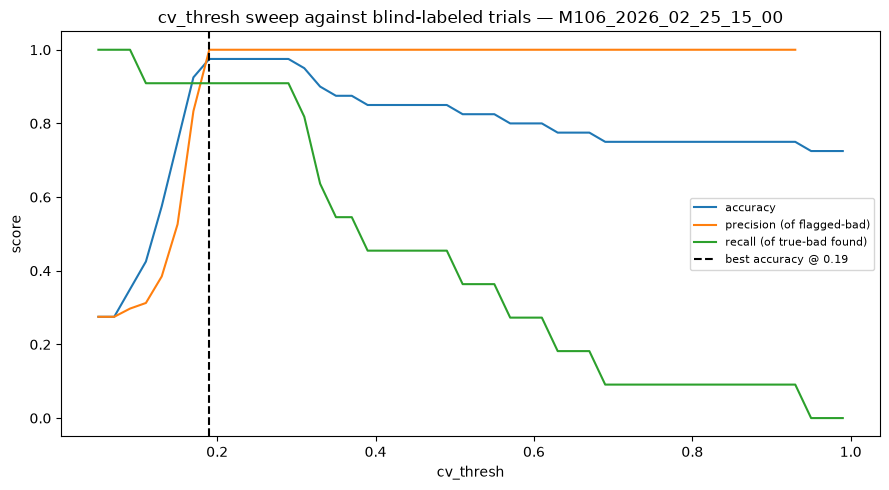

In [14]:
def evaluate_cv_thresholds(labels, trial_td, thresh_range):
    records = []
    for trial_id_str, label in labels.items():
        trial_id = int(trial_id_str) if trial_id_str.lstrip("-").isdigit() else trial_id_str
        row = trial_td.loc[trial_id]
        vel = np.gradient(row.bhv, axis=0)
        speed = np.linalg.norm(vel, axis=1)[100:200]
        cv = speed.std() / speed.mean()
        records.append({"trial_id": trial_id, "label": label, "cv": cv})
    labeled_df = pd.DataFrame(records)

    rows = []
    for t in thresh_range:
        pred_bad = labeled_df["cv"] > t
        true_bad = labeled_df["label"] == "bad"
        tp = (pred_bad & true_bad).sum()
        tn = (~pred_bad & ~true_bad).sum()
        fp = (pred_bad & ~true_bad).sum()
        fn = (~pred_bad & true_bad).sum()
        accuracy = (tp + tn) / len(labeled_df)
        precision = tp / (tp + fp) if (tp + fp) > 0 else np.nan
        recall = tp / (tp + fn) if (tp + fn) > 0 else np.nan
        rows.append({"thresh": t, "accuracy": accuracy, "precision": precision, "recall": recall})
    return labeled_df, pd.DataFrame(rows)


thresh_range = np.arange(0.05, 1.0, 0.02)
labeled_df, sweep_results = evaluate_cv_thresholds(labels, trial_td, thresh_range)

best_row = sweep_results.loc[sweep_results["accuracy"].idxmax()]
print(f"{len(labeled_df)} labeled trials "
      f"({(labeled_df['label'] == 'good').sum()} good, {(labeled_df['label'] == 'bad').sum()} bad)")
print(f"Best accuracy {best_row['accuracy']:.1%} at cv_thresh={best_row['thresh']:.3f}")

fig, ax = plt.subplots(figsize=(9, 5))
ax.plot(sweep_results["thresh"], sweep_results["accuracy"], label="accuracy")
ax.plot(sweep_results["thresh"], sweep_results["precision"], label="precision (of flagged-bad)")
ax.plot(sweep_results["thresh"], sweep_results["recall"], label="recall (of true-bad found)")
ax.axvline(best_row["thresh"], color="k", linestyle="--", label=f"best accuracy @ {best_row['thresh']:.2f}")
ax.set_xlabel("cv_thresh")
ax.set_ylabel("score")
ax.set_title(f"cv_thresh sweep against blind-labeled trials — {session}")
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

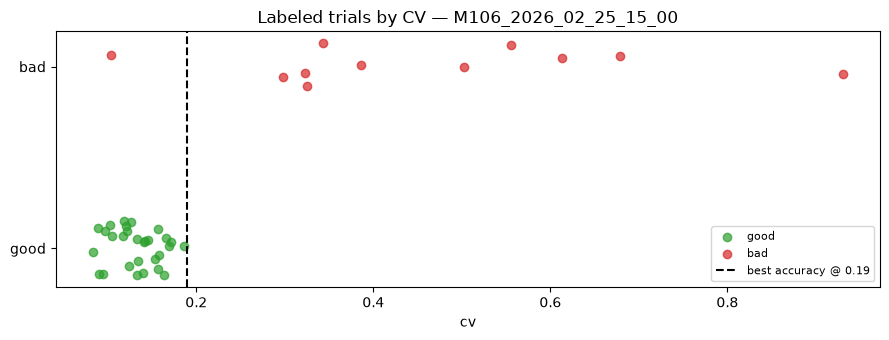

In [15]:
# Raw labeled points: each trial's actual CV, split by your label — a direct look at how
# cleanly (or not) "good"/"bad" separate along the CV axis
fig, ax = plt.subplots(figsize=(9, 3.5))
rng2 = np.random.default_rng(0)
for lbl, color, y in [("good", "tab:green", 0), ("bad", "tab:red", 1)]:
    sub = labeled_df[labeled_df["label"] == lbl]
    jitter = rng2.uniform(-0.15, 0.15, len(sub))
    ax.scatter(sub["cv"], y + jitter, color=color, label=lbl, alpha=0.7)
ax.axvline(best_row["thresh"], color="k", linestyle="--", label=f"best accuracy @ {best_row['thresh']:.2f}")
ax.set_yticks([0, 1])
ax.set_yticklabels(["good", "bad"])
ax.set_xlabel("cv")
ax.set_title(f"Labeled trials by CV — {session}")
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

## Apply the found cv_thresh to filter trial_td

Keep a trial only if it clears both criteria: `mean_speed > otsu_thresh` (was actually running) and `cv <= cv_thresh` (stayed consistent), using the accuracy-maximizing `cv_thresh` from the label sweep above. Reported separately by which criterion did the dropping, so the cv contribution isn't hidden inside the total.

In [136]:
cv_thresh = best_row["thresh"]  # accuracy-maximizing value from the label sweep above

mean_speeds, cvs = [], []
for idx, row in trial_td.iterrows():
    vel = np.gradient(row.bhv, axis=0)
    speed = np.linalg.norm(vel, axis=1)[100:200]
    mean_speed = speed.mean()
    mean_speeds.append(mean_speed)
    cvs.append(speed.std() / mean_speed)

mean_speeds = np.array(mean_speeds)
cvs = np.array(cvs)

keep_mask = (mean_speeds > otsu_thresh) & (cvs <= cv_thresh)
trial_td_filtered = trial_td[keep_mask]

n_total = len(trial_td)
n_kept = int(keep_mask.sum())
n_dropped = n_total - n_kept
n_dropped_mean = int((mean_speeds <= otsu_thresh).sum())
n_dropped_cv = int(((mean_speeds > otsu_thresh) & (cvs > cv_thresh)).sum())

print(f"cv_thresh = {cv_thresh:.3f} (best-accuracy value from the label sweep above)")
print(f"otsu_thresh (mean-speed floor) = {otsu_thresh:.3f}")
print()
print(f"{n_total} total trials")
print(f"  {n_dropped_mean} dropped: mean_speed <= otsu_thresh")
print(f"  {n_dropped_cv} dropped: passed the mean floor but cv > cv_thresh")
print(f"  {n_dropped} dropped total ({n_dropped / n_total:.1%})")
print(f"  {n_kept} kept ({n_kept / n_total:.1%})")

cv_thresh = 0.190 (best-accuracy value from the label sweep above)
otsu_thresh (mean-speed floor) = 2.146

426 total trials
  17 dropped: mean_speed <= otsu_thresh
  105 dropped: passed the mean floor but cv > cv_thresh
  122 dropped total (28.6%)
  304 kept (71.4%)


## Visual check: random sample of dropped trials

Kinematics + speed for 10 random trials that failed `keep_mask` above, with the `[100:200]` window shaded and each panel labelled with which criterion(s) it failed (`mean` and/or `cv`) plus the actual values — to double-check the combined filter is dropping trials for the right reasons.

122 dropped trials total; showing 10 random ones


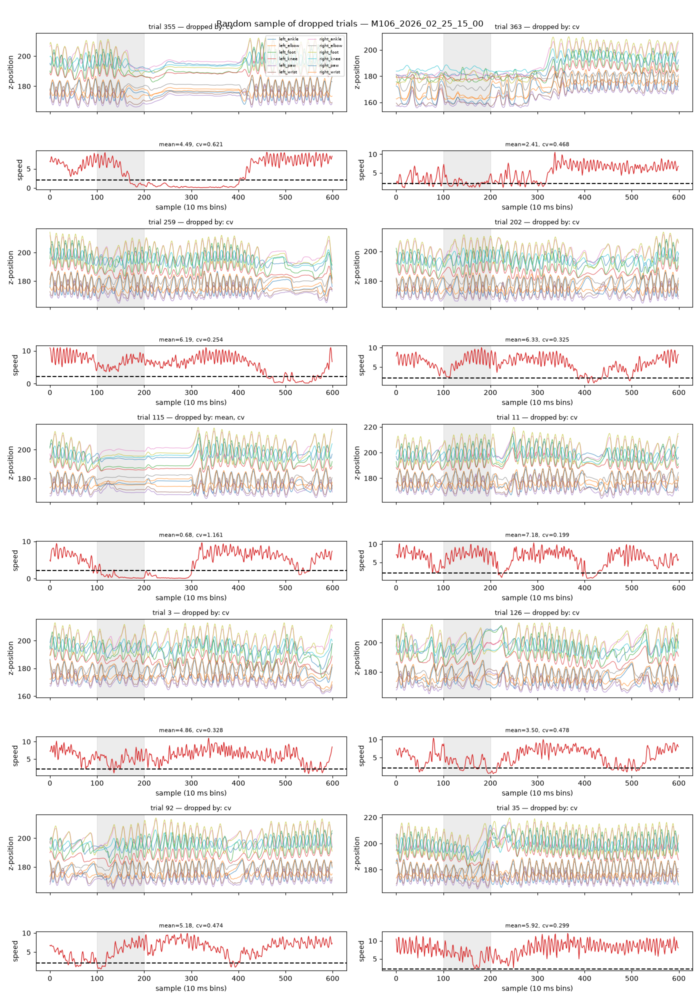

In [139]:
rng3 = np.random.default_rng(0)
dropped_ids = trial_td.index[~keep_mask]
n_show = min(10, len(dropped_ids))
dropped_sample = rng3.choice(dropped_ids, size=n_show, replace=False)
print(f"{len(dropped_ids)} dropped trials total; showing {n_show} random ones")

z_col_idx = np.arange(start=2, stop=len(Params.oscillating_keypoints) * 3, step=3)
ncols = 2
nrows_trials = int(np.ceil(n_show / ncols))
fig, axs = plt.subplots(
    nrows_trials * 2, ncols, figsize=(14, 4 * nrows_trials), sharex=False,
    gridspec_kw={"height_ratios": [2, 1] * nrows_trials},
)
axs = np.atleast_2d(axs)

for i, tr_id in enumerate(dropped_sample):
    block, col = divmod(i, ncols)
    ax_kin = axs[block * 2, col]
    ax_speed = axs[block * 2 + 1, col]

    row = trial_td.loc[tr_id]
    vel = np.gradient(row.bhv, axis=0)
    speed = np.linalg.norm(vel, axis=1)
    window = speed[100:200]
    m, c = window.mean(), window.std() / window.mean()
    reasons = []
    if m <= otsu_thresh:
        reasons.append("mean")
    if c > cv_thresh:
        reasons.append("cv")

    for z_idx, kp in zip(z_col_idx, Params.oscillating_keypoints):
        ax_kin.plot(row.bhv[:, z_idx], label=kp, alpha=0.7, lw=0.8)
    ax_kin.axvspan(100, 200, color="gray", alpha=0.15)
    ax_kin.set_title(f"trial {tr_id} — dropped by: {', '.join(reasons)}", fontsize=9)
    ax_kin.set_ylabel("z-position")
    ax_kin.tick_params(labelbottom=False)

    ax_speed.plot(speed, color="tab:red", lw=1)
    ax_speed.axhline(otsu_thresh, color="k", linestyle="--", label="otsu_thresh")
    ax_speed.axvspan(100, 200, color="gray", alpha=0.15)
    ax_speed.set_ylabel("speed")
    ax_speed.set_xlabel("sample (10 ms bins)")
    ax_speed.set_title(f"mean={m:.2f}, cv={c:.3f}", fontsize=8)

for j in range(n_show, nrows_trials * ncols):
    block, col = divmod(j, ncols)
    axs[block * 2, col].axis("off")
    axs[block * 2 + 1, col].axis("off")

axs[0, 0].legend(fontsize=6, ncol=2, loc="upper right")
fig.suptitle(f"Random sample of dropped trials — {session}")
plt.tight_layout()
plt.show()

## Visual check: random sample of kept trials

Same view as above, but for 10 random trials that *passed* `keep_mask` — to confirm the trials being kept genuinely look like consistent running through the shaded `[100:200]` window, not just ones that happened to clear the thresholds narrowly.

304 kept trials total; showing 10 random ones


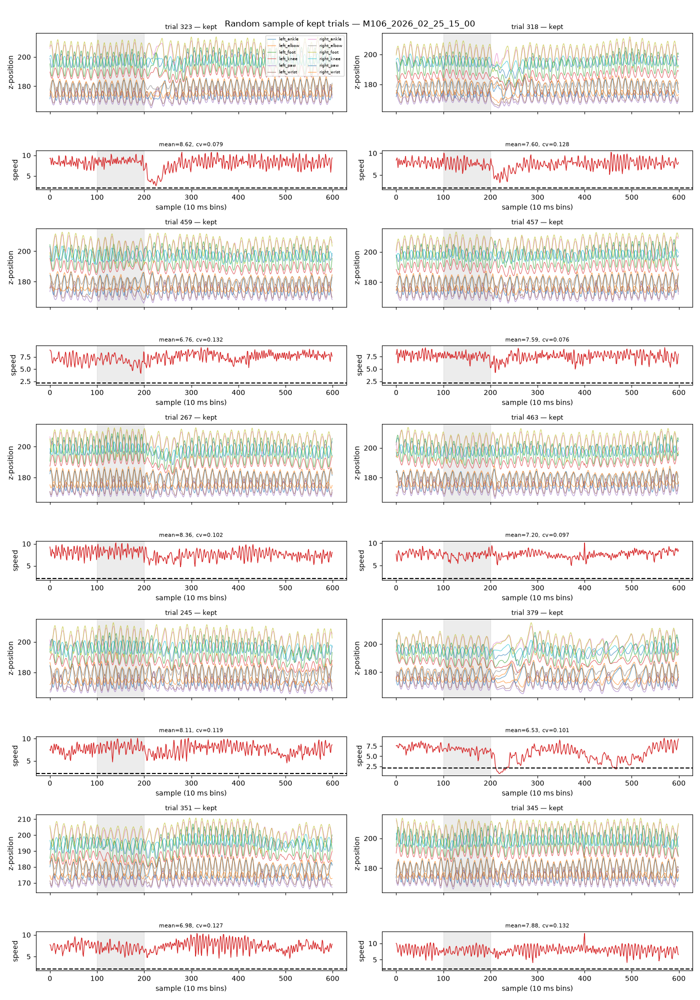

In [150]:
rng4 = np.random.default_rng()
kept_ids = trial_td.index[keep_mask]
n_show = min(10, len(kept_ids))
kept_sample = rng4.choice(kept_ids, size=n_show, replace=False)
print(f"{len(kept_ids)} kept trials total; showing {n_show} random ones")

z_col_idx = np.arange(start=2, stop=len(Params.oscillating_keypoints) * 3, step=3)
ncols = 2
nrows_trials = int(np.ceil(n_show / ncols))
fig, axs = plt.subplots(
    nrows_trials * 2, ncols, figsize=(14, 4 * nrows_trials), sharex=False,
    gridspec_kw={"height_ratios": [2, 1] * nrows_trials},
)
axs = np.atleast_2d(axs)

for i, tr_id in enumerate(kept_sample):
    block, col = divmod(i, ncols)
    ax_kin = axs[block * 2, col]
    ax_speed = axs[block * 2 + 1, col]

    row = trial_td.loc[tr_id]
    vel = np.gradient(row.bhv, axis=0)
    speed = np.linalg.norm(vel, axis=1)
    window = speed[100:200]
    m, c = window.mean(), window.std() / window.mean()

    for z_idx, kp in zip(z_col_idx, Params.oscillating_keypoints):
        ax_kin.plot(row.bhv[:, z_idx], label=kp, alpha=0.7, lw=0.8)
    ax_kin.axvspan(100, 200, color="gray", alpha=0.15)
    ax_kin.set_title(f"trial {tr_id} — kept", fontsize=9)
    ax_kin.set_ylabel("z-position")
    ax_kin.tick_params(labelbottom=False)

    ax_speed.plot(speed, color="tab:red", lw=1)
    ax_speed.axhline(otsu_thresh, color="k", linestyle="--", label="otsu_thresh")
    ax_speed.axvspan(100, 200, color="gray", alpha=0.15)
    ax_speed.set_ylabel("speed")
    ax_speed.set_xlabel("sample (10 ms bins)")
    ax_speed.set_title(f"mean={m:.2f}, cv={c:.3f}", fontsize=8)

for j in range(n_show, nrows_trials * ncols):
    block, col = divmod(j, ncols)
    axs[block * 2, col].axis("off")
    axs[block * 2 + 1, col].axis("off")

axs[0, 0].legend(fontsize=6, ncol=2, loc="upper right")
fig.suptitle(f"Random sample of kept trials — {session}")
plt.tight_layout()
plt.show()